In [ ]:
import numpy as np
import keras as ke
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow import reshape
from tensorflow.keras import Model,backend
from keras.models import Sequential
from matplotlib.pyplot import figure
from sklearn.metrics import mean_squared_error
import gc
import pandas as pd

In [ ]:
p= 100; 
n = 600;
sigma_2 = 0.5;
delta = 0.1;
seed = 100;
epochs = 100;

In [ ]:
train_loss_1 = np.zeros((epochs,seed))
test_loss_1 = np.zeros((epochs,seed))
train_loss_2 = np.zeros((epochs,seed))
test_loss_2 = np.zeros((epochs,seed))
train_loss_3 = np.zeros((epochs,seed))
test_loss_3 = np.zeros((epochs,seed))
train_loss_4 = np.zeros((epochs,seed))
test_loss_4 = np.zeros((epochs,seed))
train_loss_5 = np.zeros((epochs,seed))
test_loss_5 = np.zeros((epochs,seed))
train_loss_6 = np.zeros((epochs,seed))
test_loss_6 = np.zeros((epochs,seed))

In [ ]:
mean_square_error_1 = [];
mean_square_error_2 = [];
mean_square_error_3 = [];
mean_square_error_4 = [];
mean_square_error_5 = [];
mean_square_error_6 = [];

In [ ]:
def create_model_1(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model


In [ ]:
def create_model_2(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def create_model_3(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),        
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def create_model_4(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),        
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def create_model_5(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(3*p/4, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),  
        tf.keras.layers.Dense(p/2, activation="relu"),        
        tf.keras.layers.Dense(3*p/4, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def create_model_6(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(3*p/4, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),  
        tf.keras.layers.Dense(p/2, activation="relu"),        
        tf.keras.layers.Dense(3*p/4, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def simulation_processing(loss_file):

  loss = pd.DataFrame(loss_file)
  loss['min'] = loss.min(axis=1)
  loss['max'] = loss.max(axis=1)
  loss['mean'] = loss.mean(axis=1)
  loss['std'] = loss.std(axis=1)

  return loss

In [ ]:
def plot_seeds(loss):
  plt.figure(figsize=(10, 10))
  plt.plot(loss)
  plt.title('All seeds loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend()
  
  return plt.show()


In [ ]:
for f in range(0,seed):
  A = np.random.rand(p,p)
  n_max = np.amax(A)
  phi = A/((1+delta)*n_max)
  X = np.random.uniform(0,1,p)
  X_t = np.zeros((n+100,p))

  for i in range(0,n+100):
    E_t = np.random.uniform(0,sigma_2,p)
    XX = np.zeros((p,p));
    XX[0,:] = X[:];
    aa = phi*XX + E_t;
    X_t[i,:] = aa[0,:];
    X = X_t[i,:];

  X_tt = X_t[100:,:]
  X_train = X_tt[:499,:]
  y_train = X_tt[1:500,:]
  X_test = X_tt[499:599,:]
  Y_test = X_tt[500:,:]

  model_1 = create_model_1(p)
  history = model_1.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_1[:,f] = history.history['loss']
  test_loss_1[:,f] = history.history['val_loss']

  model_2 = create_model_2(p)
  history = model_2.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_2[:,f] = history.history['loss']
  test_loss_2[:,f] = history.history['val_loss']

  model_3 = create_model_3(p)
  history = model_3.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_3[:,f] = history.history['loss']
  test_loss_3[:,f] = history.history['val_loss']

  model_4 = create_model_4(p)
  history = model_4.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_4[:,f] = history.history['loss']
  test_loss_4[:,f] = history.history['val_loss']

  model_5 = create_model_5(p)
  history = model_5.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_5[:,f] = history.history['loss']
  test_loss_5[:,f] = history.history['val_loss']

  model_6 = create_model_6(p)
  history = model_6.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_6[:,f] = history.history['loss']
  test_loss_6[:,f] = history.history['val_loss']

  mean_square_error_1.append(mean_squared_error(Y_test,model_1.predict(X_test)))
  mean_square_error_2.append(mean_squared_error(Y_test,model_2.predict(X_test)))
  mean_square_error_3.append(mean_squared_error(Y_test,model_3.predict(X_test)))
  mean_square_error_4.append(mean_squared_error(Y_test,model_4.predict(X_test)))
  mean_square_error_5.append(mean_squared_error(Y_test,model_5.predict(X_test)))
  mean_square_error_6.append(mean_squared_error(Y_test,model_6.predict(X_test)))

  del model_1
  del model_2
  del model_3
  del model_4
  del model_5
  del model_6
  del history
  del A
  del n_max
  del X
  del X_t




/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/100
16/16 - 2s - loss: 0.3910 - val_loss: 0.3027 - 2s/epoch - 99ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2918 - val_loss: 0.2888 - 146ms/epoch - 9ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2852 - val_loss: 0.2871 - 159ms/epoch - 10ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2837 - val_loss: 0.2855 - 111ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2826 - val_loss: 0.2886 - 125ms/epoch - 8ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2836 - val_loss: 0.2842 - 100ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2818 - val_loss: 0.2840 - 165ms/epoch - 10ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2823 - val_loss: 0.2834 - 138ms/epoch - 9ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2812 - val_loss: 0.2836 - 103ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2782 - val_loss: 0.2798 - 153ms/epoch - 10ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2707 - val_loss: 0.2711 - 160ms/epoch - 10ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2678 - val_loss: 0.2734 - 193ms/epoch - 12ms/step
Epoch 13/1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3494 - val_loss: 0.2631 - 520ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2523 - val_loss: 0.2435 - 76ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2401 - val_loss: 0.2411 - 64ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2376 - val_loss: 0.2388 - 65ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2371 - val_loss: 0.2389 - 60ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2375 - val_loss: 0.2394 - 82ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2366 - val_loss: 0.2404 - 70ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2362 - val_loss: 0.2403 - 55ms/epoch - 3ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2375 - val_loss: 0.2414 - 67ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2361 - val_loss: 0.2412 - 77ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2360 - val_loss: 0.2398 - 82ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2358 - val_loss: 0.2403 - 72ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3579 - val_loss: 0.2579 - 516ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2514 - val_loss: 0.2465 - 62ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2450 - val_loss: 0.2439 - 74ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2438 - val_loss: 0.2425 - 78ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2436 - val_loss: 0.2423 - 63ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2427 - val_loss: 0.2413 - 82ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2438 - val_loss: 0.2449 - 57ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2427 - val_loss: 0.2418 - 80ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2414 - val_loss: 0.2409 - 59ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2416 - val_loss: 0.2408 - 70ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2411 - val_loss: 0.2416 - 58ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2409 - val_loss: 0.2410 - 71ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4484 - val_loss: 0.3851 - 504ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3667 - val_loss: 0.3586 - 76ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3519 - val_loss: 0.3549 - 60ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3478 - val_loss: 0.3507 - 74ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3461 - val_loss: 0.3486 - 71ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3450 - val_loss: 0.3514 - 64ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3455 - val_loss: 0.3497 - 64ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3452 - val_loss: 0.3493 - 61ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3449 - val_loss: 0.3493 - 75ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3447 - val_loss: 0.3493 - 70ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.3442 - val_loss: 0.3489 - 77ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.3437 - val_loss: 0.3508 - 58ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.3

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3217 - val_loss: 0.2535 - 520ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2474 - val_loss: 0.2469 - 60ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2428 - val_loss: 0.2399 - 55ms/epoch - 3ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2389 - val_loss: 0.2329 - 64ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2301 - val_loss: 0.2288 - 74ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2289 - val_loss: 0.2291 - 60ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2297 - val_loss: 0.2315 - 76ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2285 - val_loss: 0.2284 - 73ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2282 - val_loss: 0.2280 - 86ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2273 - val_loss: 0.2269 - 62ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2265 - val_loss: 0.2263 - 66ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2244 - val_loss: 0.2251 - 76ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3867 - val_loss: 0.3049 - 538ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2935 - val_loss: 0.2727 - 61ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2696 - val_loss: 0.2718 - 63ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2667 - val_loss: 0.2700 - 80ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2646 - val_loss: 0.2660 - 55ms/epoch - 3ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2638 - val_loss: 0.2678 - 80ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2636 - val_loss: 0.2652 - 59ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2627 - val_loss: 0.2671 - 62ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2616 - val_loss: 0.2678 - 60ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2617 - val_loss: 0.2656 - 59ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2623 - val_loss: 0.2669 - 85ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2627 - val_loss: 0.2660 - 78ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3829 - val_loss: 0.2691 - 547ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2557 - val_loss: 0.2533 - 75ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2462 - val_loss: 0.2507 - 65ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2450 - val_loss: 0.2481 - 75ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2437 - val_loss: 0.2464 - 62ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2425 - val_loss: 0.2454 - 63ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2422 - val_loss: 0.2488 - 86ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2432 - val_loss: 0.2460 - 64ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2421 - val_loss: 0.2468 - 83ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2416 - val_loss: 0.2461 - 65ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2413 - val_loss: 0.2462 - 66ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2408 - val_loss: 0.2461 - 77ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4102 - val_loss: 0.2985 - 511ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2865 - val_loss: 0.2791 - 80ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2785 - val_loss: 0.2738 - 79ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2756 - val_loss: 0.2736 - 82ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2738 - val_loss: 0.2731 - 73ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2730 - val_loss: 0.2730 - 64ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2731 - val_loss: 0.2783 - 76ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2736 - val_loss: 0.2738 - 63ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2723 - val_loss: 0.2733 - 62ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2719 - val_loss: 0.2746 - 83ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2711 - val_loss: 0.2720 - 63ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2705 - val_loss: 0.2710 - 71ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3647 - val_loss: 0.2750 - 562ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2657 - val_loss: 0.2619 - 76ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2597 - val_loss: 0.2582 - 62ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2550 - val_loss: 0.2503 - 57ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2435 - val_loss: 0.2437 - 67ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2414 - val_loss: 0.2426 - 89ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2401 - val_loss: 0.2433 - 82ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2404 - val_loss: 0.2420 - 81ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2400 - val_loss: 0.2431 - 68ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2396 - val_loss: 0.2425 - 69ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2399 - val_loss: 0.2437 - 63ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2398 - val_loss: 0.2420 - 63ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.3822 - val_loss: 0.2668 - 500ms/epoch - 31ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2407 - val_loss: 0.2350 - 89ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2243 - val_loss: 0.2174 - 70ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2134 - val_loss: 0.2216 - 65ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2129 - val_loss: 0.2160 - 63ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2113 - val_loss: 0.2173 - 81ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2114 - val_loss: 0.2191 - 69ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2124 - val_loss: 0.2187 - 86ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2108 - val_loss: 0.2177 - 79ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2113 - val_loss: 0.2159 - 62ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2109 - val_loss: 0.2181 - 75ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2102 - val_loss: 0.2172 - 62ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3554 - val_loss: 0.2658 - 504ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2572 - val_loss: 0.2480 - 83ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2477 - val_loss: 0.2443 - 69ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2462 - val_loss: 0.2465 - 81ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2468 - val_loss: 0.2431 - 67ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2452 - val_loss: 0.2440 - 81ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2440 - val_loss: 0.2440 - 69ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2445 - val_loss: 0.2415 - 95ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2433 - val_loss: 0.2431 - 73ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2433 - val_loss: 0.2433 - 64ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2430 - val_loss: 0.2419 - 72ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2423 - val_loss: 0.2444 - 75ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/100
16/16 - 1s - loss: 0.3759 - val_loss: 0.3090 - 513ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2994 - val_loss: 0.2869 - 86ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2849 - val_loss: 0.2825 - 67ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2818 - val_loss: 0.2812 - 85ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2812 - val_loss: 0.2814 - 69ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2806 - val_loss: 0.2821 - 84ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2803 - val_loss: 0.2814 - 86ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2806 - val_loss: 0.2800 - 85ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2802 - val_loss: 0.2816 - 70ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2796 - val_loss: 0.2808 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2792 - val_loss: 0.2805 - 74ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2791 - val_loss: 0.2824 - 86ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3031 - val_loss: 0.2287 - 525ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2264 - val_loss: 0.2179 - 66ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2222 - val_loss: 0.2138 - 86ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2178 - val_loss: 0.2126 - 65ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2178 - val_loss: 0.2145 - 67ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2179 - val_loss: 0.2127 - 71ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2165 - val_loss: 0.2110 - 66ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2157 - val_loss: 0.2119 - 72ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2123 - val_loss: 0.2068 - 74ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2103 - val_loss: 0.2058 - 71ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2099 - val_loss: 0.2059 - 87ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2087 - val_loss: 0.2057 - 72ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3724 - val_loss: 0.2914 - 508ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2758 - val_loss: 0.2713 - 80ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2652 - val_loss: 0.2642 - 88ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2629 - val_loss: 0.2679 - 73ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2635 - val_loss: 0.2656 - 83ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2630 - val_loss: 0.2658 - 75ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2622 - val_loss: 0.2662 - 69ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2621 - val_loss: 0.2655 - 88ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2614 - val_loss: 0.2643 - 71ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2609 - val_loss: 0.2643 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2610 - val_loss: 0.2671 - 66ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2595 - val_loss: 0.2685 - 88ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3496 - val_loss: 0.2557 - 521ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2392 - val_loss: 0.2403 - 68ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2290 - val_loss: 0.2338 - 69ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2268 - val_loss: 0.2331 - 67ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2262 - val_loss: 0.2328 - 82ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2252 - val_loss: 0.2328 - 70ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2258 - val_loss: 0.2344 - 85ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2256 - val_loss: 0.2356 - 80ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2245 - val_loss: 0.2337 - 77ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2248 - val_loss: 0.2331 - 87ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2242 - val_loss: 0.2329 - 89ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2236 - val_loss: 0.2323 - 69ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4177 - val_loss: 0.3129 - 508ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2872 - val_loss: 0.2844 - 72ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2738 - val_loss: 0.2792 - 69ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2720 - val_loss: 0.2736 - 85ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2703 - val_loss: 0.2736 - 86ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2697 - val_loss: 0.2735 - 88ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2697 - val_loss: 0.2725 - 64ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2694 - val_loss: 0.2736 - 70ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2688 - val_loss: 0.2716 - 71ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2684 - val_loss: 0.2731 - 91ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2674 - val_loss: 0.2720 - 75ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2676 - val_loss: 0.2715 - 84ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4104 - val_loss: 0.3197 - 512ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3100 - val_loss: 0.2984 - 83ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2949 - val_loss: 0.2896 - 80ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2915 - val_loss: 0.2855 - 83ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2888 - val_loss: 0.2851 - 65ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2888 - val_loss: 0.2858 - 92ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2876 - val_loss: 0.2841 - 71ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2878 - val_loss: 0.2852 - 76ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2870 - val_loss: 0.2847 - 68ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2874 - val_loss: 0.2851 - 87ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2868 - val_loss: 0.2837 - 71ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2863 - val_loss: 0.2836 - 92ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3294 - val_loss: 0.2563 - 514ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2483 - val_loss: 0.2447 - 85ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2430 - val_loss: 0.2470 - 84ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2422 - val_loss: 0.2402 - 71ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2401 - val_loss: 0.2404 - 81ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2389 - val_loss: 0.2389 - 95ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2383 - val_loss: 0.2407 - 86ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2383 - val_loss: 0.2400 - 73ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2380 - val_loss: 0.2389 - 73ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2373 - val_loss: 0.2396 - 80ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2371 - val_loss: 0.2401 - 72ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2374 - val_loss: 0.2404 - 82ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.4530 - val_loss: 0.3388 - 498ms/epoch - 31ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3165 - val_loss: 0.2924 - 73ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2914 - val_loss: 0.2853 - 72ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2888 - val_loss: 0.2848 - 95ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2860 - val_loss: 0.2841 - 92ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2862 - val_loss: 0.2841 - 79ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2861 - val_loss: 0.2834 - 76ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2858 - val_loss: 0.2834 - 72ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2851 - val_loss: 0.2824 - 90ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2843 - val_loss: 0.2841 - 88ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2846 - val_loss: 0.2836 - 78ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2843 - val_loss: 0.2834 - 98ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3578 - val_loss: 0.2837 - 513ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2712 - val_loss: 0.2516 - 107ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2560 - val_loss: 0.2506 - 87ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2548 - val_loss: 0.2507 - 74ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2532 - val_loss: 0.2536 - 89ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2532 - val_loss: 0.2531 - 80ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2536 - val_loss: 0.2499 - 72ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2531 - val_loss: 0.2513 - 87ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2524 - val_loss: 0.2493 - 92ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2522 - val_loss: 0.2498 - 77ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2514 - val_loss: 0.2506 - 75ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2518 - val_loss: 0.2487 - 107ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3829 - val_loss: 0.2909 - 508ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2680 - val_loss: 0.2583 - 77ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2528 - val_loss: 0.2516 - 74ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2506 - val_loss: 0.2510 - 83ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2497 - val_loss: 0.2519 - 93ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2502 - val_loss: 0.2517 - 73ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2497 - val_loss: 0.2510 - 79ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2494 - val_loss: 0.2519 - 93ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2492 - val_loss: 0.2511 - 84ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2488 - val_loss: 0.2510 - 74ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2492 - val_loss: 0.2500 - 70ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2479 - val_loss: 0.2496 - 100ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4169 - val_loss: 0.3076 - 518ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2731 - val_loss: 0.2622 - 73ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2543 - val_loss: 0.2586 - 73ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2524 - val_loss: 0.2590 - 72ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2516 - val_loss: 0.2548 - 71ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2502 - val_loss: 0.2548 - 75ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2491 - val_loss: 0.2530 - 110ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2483 - val_loss: 0.2527 - 66ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2476 - val_loss: 0.2533 - 64ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2477 - val_loss: 0.2547 - 87ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2481 - val_loss: 0.2530 - 85ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2471 - val_loss: 0.2535 - 71ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3662 - val_loss: 0.2882 - 508ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2797 - val_loss: 0.2746 - 87ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2738 - val_loss: 0.2737 - 85ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2725 - val_loss: 0.2729 - 81ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2713 - val_loss: 0.2724 - 93ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2719 - val_loss: 0.2707 - 88ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2664 - val_loss: 0.2693 - 78ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2649 - val_loss: 0.2638 - 74ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2596 - val_loss: 0.2606 - 76ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2579 - val_loss: 0.2599 - 68ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2585 - val_loss: 0.2544 - 83ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2469 - val_loss: 0.2453 - 80ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3856 - val_loss: 0.3123 - 532ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3083 - val_loss: 0.3029 - 72ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2906 - val_loss: 0.2801 - 79ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2798 - val_loss: 0.2771 - 65ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2771 - val_loss: 0.2780 - 78ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2767 - val_loss: 0.2792 - 80ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2758 - val_loss: 0.2787 - 88ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2770 - val_loss: 0.2780 - 69ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2755 - val_loss: 0.2765 - 72ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2746 - val_loss: 0.2751 - 71ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2730 - val_loss: 0.2757 - 73ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2717 - val_loss: 0.2734 - 81ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4199 - val_loss: 0.3525 - 516ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3178 - val_loss: 0.3119 - 75ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3014 - val_loss: 0.3076 - 73ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2999 - val_loss: 0.3082 - 94ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2979 - val_loss: 0.3065 - 79ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2974 - val_loss: 0.3061 - 72ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2970 - val_loss: 0.3061 - 88ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2982 - val_loss: 0.3059 - 91ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2964 - val_loss: 0.3050 - 99ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2966 - val_loss: 0.3065 - 80ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2959 - val_loss: 0.3059 - 94ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2949 - val_loss: 0.3049 - 75ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3726 - val_loss: 0.2876 - 515ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2726 - val_loss: 0.2690 - 94ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2637 - val_loss: 0.2674 - 79ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2629 - val_loss: 0.2675 - 92ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2619 - val_loss: 0.2660 - 83ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2611 - val_loss: 0.2650 - 75ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2605 - val_loss: 0.2649 - 92ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2604 - val_loss: 0.2639 - 74ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2598 - val_loss: 0.2649 - 97ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2594 - val_loss: 0.2653 - 75ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2606 - val_loss: 0.2656 - 81ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2599 - val_loss: 0.2651 - 78ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3369 - val_loss: 0.2493 - 508ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2372 - val_loss: 0.2339 - 76ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2278 - val_loss: 0.2270 - 97ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2172 - val_loss: 0.2194 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2150 - val_loss: 0.2183 - 75ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2135 - val_loss: 0.2198 - 78ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2135 - val_loss: 0.2182 - 99ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2131 - val_loss: 0.2181 - 91ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2130 - val_loss: 0.2191 - 91ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2131 - val_loss: 0.2170 - 75ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2132 - val_loss: 0.2207 - 101ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2123 - val_loss: 0.2176 - 94ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3414 - val_loss: 0.2546 - 949ms/epoch - 59ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2380 - val_loss: 0.2370 - 91ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2285 - val_loss: 0.2389 - 86ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2289 - val_loss: 0.2332 - 80ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2258 - val_loss: 0.2298 - 100ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2250 - val_loss: 0.2310 - 76ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2244 - val_loss: 0.2310 - 100ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2241 - val_loss: 0.2316 - 76ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2244 - val_loss: 0.2287 - 74ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2245 - val_loss: 0.2306 - 94ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2229 - val_loss: 0.2302 - 77ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2227 - val_loss: 0.2298 - 83ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3703 - val_loss: 0.2546 - 506ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2309 - val_loss: 0.2303 - 78ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2230 - val_loss: 0.2282 - 75ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2204 - val_loss: 0.2280 - 78ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2197 - val_loss: 0.2277 - 80ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2195 - val_loss: 0.2263 - 82ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2181 - val_loss: 0.2261 - 98ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2182 - val_loss: 0.2267 - 74ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2189 - val_loss: 0.2264 - 97ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2179 - val_loss: 0.2264 - 74ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2172 - val_loss: 0.2246 - 93ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2161 - val_loss: 0.2261 - 74ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3719 - val_loss: 0.2627 - 511ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2504 - val_loss: 0.2385 - 78ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2406 - val_loss: 0.2349 - 87ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2383 - val_loss: 0.2357 - 70ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2365 - val_loss: 0.2325 - 78ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2356 - val_loss: 0.2328 - 95ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2351 - val_loss: 0.2312 - 96ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2350 - val_loss: 0.2315 - 84ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2346 - val_loss: 0.2316 - 85ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2346 - val_loss: 0.2319 - 84ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2339 - val_loss: 0.2306 - 81ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2337 - val_loss: 0.2311 - 81ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3910 - val_loss: 0.3065 - 528ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2955 - val_loss: 0.2906 - 74ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2881 - val_loss: 0.2864 - 79ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2853 - val_loss: 0.2854 - 77ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2845 - val_loss: 0.2865 - 91ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2850 - val_loss: 0.2864 - 78ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2822 - val_loss: 0.2844 - 87ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2811 - val_loss: 0.2839 - 83ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2809 - val_loss: 0.2826 - 84ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2807 - val_loss: 0.2840 - 81ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2802 - val_loss: 0.2845 - 80ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2795 - val_loss: 0.2825 - 83ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3361 - val_loss: 0.2651 - 541ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2579 - val_loss: 0.2522 - 109ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2493 - val_loss: 0.2476 - 76ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2449 - val_loss: 0.2497 - 78ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2446 - val_loss: 0.2462 - 99ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2434 - val_loss: 0.2462 - 81ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2439 - val_loss: 0.2450 - 81ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2423 - val_loss: 0.2421 - 78ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2371 - val_loss: 0.2380 - 81ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2354 - val_loss: 0.2393 - 77ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2341 - val_loss: 0.2372 - 85ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2327 - val_loss: 0.2374 - 75ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3932 - val_loss: 0.3213 - 534ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3078 - val_loss: 0.3039 - 79ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3019 - val_loss: 0.2982 - 81ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2958 - val_loss: 0.2978 - 97ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2942 - val_loss: 0.2960 - 93ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2945 - val_loss: 0.2950 - 84ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2936 - val_loss: 0.2963 - 81ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2936 - val_loss: 0.2965 - 76ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2933 - val_loss: 0.2960 - 81ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2944 - val_loss: 0.2954 - 81ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2936 - val_loss: 0.2947 - 101ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2931 - val_loss: 0.2943 - 82ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3256 - val_loss: 0.2422 - 515ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2317 - val_loss: 0.2244 - 78ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2254 - val_loss: 0.2224 - 90ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2227 - val_loss: 0.2189 - 90ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2203 - val_loss: 0.2182 - 83ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2196 - val_loss: 0.2163 - 79ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2186 - val_loss: 0.2174 - 77ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2182 - val_loss: 0.2166 - 104ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2176 - val_loss: 0.2171 - 97ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2177 - val_loss: 0.2185 - 83ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2177 - val_loss: 0.2179 - 81ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2164 - val_loss: 0.2164 - 82ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3939 - val_loss: 0.3194 - 509ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3030 - val_loss: 0.2977 - 123ms/epoch - 8ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2929 - val_loss: 0.2939 - 77ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2905 - val_loss: 0.2919 - 100ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2891 - val_loss: 0.2920 - 82ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2890 - val_loss: 0.2919 - 83ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2889 - val_loss: 0.2926 - 89ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2884 - val_loss: 0.2928 - 87ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2884 - val_loss: 0.2900 - 83ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2876 - val_loss: 0.2896 - 95ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2874 - val_loss: 0.2890 - 83ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2871 - val_loss: 0.2905 - 98ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3973 - val_loss: 0.3059 - 551ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2932 - val_loss: 0.2899 - 87ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2828 - val_loss: 0.2842 - 108ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2799 - val_loss: 0.2840 - 82ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2793 - val_loss: 0.2819 - 81ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2789 - val_loss: 0.2828 - 82ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2799 - val_loss: 0.2842 - 86ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2794 - val_loss: 0.2843 - 90ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2785 - val_loss: 0.2855 - 85ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2782 - val_loss: 0.2812 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2774 - val_loss: 0.2827 - 77ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2773 - val_loss: 0.2825 - 92ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4153 - val_loss: 0.3193 - 525ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3043 - val_loss: 0.3011 - 88ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2945 - val_loss: 0.2970 - 80ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2916 - val_loss: 0.2980 - 94ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2924 - val_loss: 0.2953 - 105ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2910 - val_loss: 0.2933 - 97ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2901 - val_loss: 0.2929 - 81ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2891 - val_loss: 0.2946 - 90ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2881 - val_loss: 0.2916 - 102ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2871 - val_loss: 0.2945 - 101ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2875 - val_loss: 0.2914 - 137ms/epoch - 9ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2856 - val_loss: 0.2885 - 84ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3883 - val_loss: 0.3004 - 517ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2947 - val_loss: 0.2897 - 87ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2881 - val_loss: 0.2845 - 75ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2858 - val_loss: 0.2829 - 81ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2846 - val_loss: 0.2830 - 78ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2845 - val_loss: 0.2846 - 76ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2851 - val_loss: 0.2818 - 80ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2846 - val_loss: 0.2837 - 80ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2838 - val_loss: 0.2836 - 83ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2834 - val_loss: 0.2818 - 89ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2830 - val_loss: 0.2827 - 86ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2829 - val_loss: 0.2828 - 88ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3937 - val_loss: 0.2724 - 563ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2563 - val_loss: 0.2525 - 85ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2479 - val_loss: 0.2494 - 80ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2446 - val_loss: 0.2476 - 85ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2433 - val_loss: 0.2483 - 97ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2437 - val_loss: 0.2479 - 100ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2432 - val_loss: 0.2464 - 99ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2432 - val_loss: 0.2475 - 84ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2428 - val_loss: 0.2468 - 102ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2419 - val_loss: 0.2484 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2423 - val_loss: 0.2470 - 100ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2424 - val_loss: 0.2456 - 78ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3126 - val_loss: 0.2507 - 536ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2443 - val_loss: 0.2418 - 89ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2370 - val_loss: 0.2366 - 89ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2347 - val_loss: 0.2363 - 94ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2340 - val_loss: 0.2363 - 91ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2333 - val_loss: 0.2354 - 81ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2327 - val_loss: 0.2349 - 96ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2330 - val_loss: 0.2342 - 99ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2326 - val_loss: 0.2348 - 88ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2322 - val_loss: 0.2374 - 84ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2323 - val_loss: 0.2352 - 102ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2317 - val_loss: 0.2351 - 98ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4548 - val_loss: 0.3772 - 525ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3549 - val_loss: 0.3587 - 103ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3480 - val_loss: 0.3577 - 84ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3474 - val_loss: 0.3575 - 80ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3477 - val_loss: 0.3583 - 84ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3470 - val_loss: 0.3582 - 83ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3459 - val_loss: 0.3574 - 79ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3456 - val_loss: 0.3563 - 85ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3451 - val_loss: 0.3570 - 94ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3453 - val_loss: 0.3580 - 102ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.3450 - val_loss: 0.3571 - 85ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.3444 - val_loss: 0.3594 - 78ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3863 - val_loss: 0.2997 - 536ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2840 - val_loss: 0.2696 - 84ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2604 - val_loss: 0.2596 - 100ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2535 - val_loss: 0.2523 - 85ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2523 - val_loss: 0.2530 - 92ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2516 - val_loss: 0.2521 - 102ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2510 - val_loss: 0.2501 - 88ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2509 - val_loss: 0.2505 - 105ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2510 - val_loss: 0.2521 - 96ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2505 - val_loss: 0.2505 - 84ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2503 - val_loss: 0.2504 - 86ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2508 - val_loss: 0.2558 - 90ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3114 - val_loss: 0.2467 - 511ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2399 - val_loss: 0.2335 - 83ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2344 - val_loss: 0.2310 - 92ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2298 - val_loss: 0.2272 - 98ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2279 - val_loss: 0.2259 - 87ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2276 - val_loss: 0.2250 - 82ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2270 - val_loss: 0.2263 - 89ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2260 - val_loss: 0.2269 - 86ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2257 - val_loss: 0.2253 - 85ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2223 - val_loss: 0.2216 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2206 - val_loss: 0.2207 - 100ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2209 - val_loss: 0.2222 - 87ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3622 - val_loss: 0.2972 - 558ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2868 - val_loss: 0.2896 - 76ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2825 - val_loss: 0.2875 - 88ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2818 - val_loss: 0.2899 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2815 - val_loss: 0.2880 - 88ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2807 - val_loss: 0.2871 - 82ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2764 - val_loss: 0.2777 - 107ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2704 - val_loss: 0.2754 - 117ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2695 - val_loss: 0.2768 - 95ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2690 - val_loss: 0.2769 - 79ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2692 - val_loss: 0.2756 - 86ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2676 - val_loss: 0.2740 - 99ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4160 - val_loss: 0.3475 - 529ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3367 - val_loss: 0.3169 - 83ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3152 - val_loss: 0.3035 - 90ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3084 - val_loss: 0.3014 - 79ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3020 - val_loss: 0.2925 - 94ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2951 - val_loss: 0.2906 - 103ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2942 - val_loss: 0.2903 - 82ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2917 - val_loss: 0.2870 - 97ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2902 - val_loss: 0.2829 - 80ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2816 - val_loss: 0.2766 - 96ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2802 - val_loss: 0.2757 - 131ms/epoch - 8ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2782 - val_loss: 0.2761 - 87ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3528 - val_loss: 0.2710 - 540ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2557 - val_loss: 0.2586 - 84ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2506 - val_loss: 0.2563 - 72ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2504 - val_loss: 0.2588 - 92ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2488 - val_loss: 0.2574 - 81ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2484 - val_loss: 0.2543 - 81ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2483 - val_loss: 0.2558 - 82ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2481 - val_loss: 0.2562 - 85ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2480 - val_loss: 0.2565 - 99ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2477 - val_loss: 0.2565 - 83ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2482 - val_loss: 0.2554 - 87ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2483 - val_loss: 0.2564 - 85ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3717 - val_loss: 0.2659 - 521ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2489 - val_loss: 0.2355 - 103ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2375 - val_loss: 0.2330 - 95ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2378 - val_loss: 0.2323 - 86ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2356 - val_loss: 0.2351 - 88ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2351 - val_loss: 0.2355 - 102ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2345 - val_loss: 0.2332 - 98ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2335 - val_loss: 0.2323 - 89ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2334 - val_loss: 0.2316 - 112ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2335 - val_loss: 0.2318 - 99ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2331 - val_loss: 0.2323 - 94ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2330 - val_loss: 0.2330 - 91ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3490 - val_loss: 0.2500 - 528ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2425 - val_loss: 0.2363 - 89ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2298 - val_loss: 0.2266 - 82ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2265 - val_loss: 0.2271 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2255 - val_loss: 0.2257 - 121ms/epoch - 8ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2238 - val_loss: 0.2262 - 128ms/epoch - 8ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2239 - val_loss: 0.2271 - 101ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2206 - val_loss: 0.2183 - 86ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2168 - val_loss: 0.2182 - 92ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2166 - val_loss: 0.2198 - 93ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2185 - val_loss: 0.2213 - 82ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2170 - val_loss: 0.2188 - 81ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4140 - val_loss: 0.3441 - 617ms/epoch - 39ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3177 - val_loss: 0.3078 - 88ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3046 - val_loss: 0.3017 - 104ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3007 - val_loss: 0.3002 - 75ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3014 - val_loss: 0.3015 - 89ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3013 - val_loss: 0.3014 - 84ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3009 - val_loss: 0.3039 - 83ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3000 - val_loss: 0.3007 - 97ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2997 - val_loss: 0.2999 - 79ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2990 - val_loss: 0.2994 - 98ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2989 - val_loss: 0.3005 - 94ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2981 - val_loss: 0.2944 - 108ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3473 - val_loss: 0.2677 - 532ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2547 - val_loss: 0.2327 - 84ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2299 - val_loss: 0.2270 - 74ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2265 - val_loss: 0.2258 - 97ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2270 - val_loss: 0.2246 - 82ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2252 - val_loss: 0.2249 - 84ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2246 - val_loss: 0.2244 - 88ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2235 - val_loss: 0.2226 - 84ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2225 - val_loss: 0.2233 - 98ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2226 - val_loss: 0.2226 - 87ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2226 - val_loss: 0.2225 - 85ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2233 - val_loss: 0.2226 - 82ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3370 - val_loss: 0.2588 - 965ms/epoch - 60ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2547 - val_loss: 0.2474 - 94ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2471 - val_loss: 0.2467 - 89ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2448 - val_loss: 0.2434 - 86ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2434 - val_loss: 0.2435 - 102ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2439 - val_loss: 0.2463 - 81ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2442 - val_loss: 0.2447 - 84ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2424 - val_loss: 0.2445 - 89ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2428 - val_loss: 0.2433 - 92ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2411 - val_loss: 0.2427 - 103ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2409 - val_loss: 0.2439 - 88ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2399 - val_loss: 0.2430 - 101ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3499 - val_loss: 0.2852 - 546ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2655 - val_loss: 0.2648 - 91ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2573 - val_loss: 0.2600 - 88ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2549 - val_loss: 0.2597 - 84ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2543 - val_loss: 0.2591 - 96ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2541 - val_loss: 0.2612 - 82ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2537 - val_loss: 0.2602 - 88ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2536 - val_loss: 0.2594 - 83ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2534 - val_loss: 0.2594 - 97ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2530 - val_loss: 0.2578 - 101ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2526 - val_loss: 0.2594 - 83ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2522 - val_loss: 0.2591 - 87ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3477 - val_loss: 0.2303 - 583ms/epoch - 36ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2271 - val_loss: 0.2187 - 98ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2191 - val_loss: 0.2180 - 81ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2182 - val_loss: 0.2159 - 98ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2174 - val_loss: 0.2151 - 94ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2167 - val_loss: 0.2157 - 94ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2169 - val_loss: 0.2152 - 108ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2165 - val_loss: 0.2167 - 94ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2155 - val_loss: 0.2146 - 112ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2153 - val_loss: 0.2159 - 107ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2152 - val_loss: 0.2138 - 101ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2147 - val_loss: 0.2155 - 99ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3635 - val_loss: 0.2741 - 527ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2620 - val_loss: 0.2570 - 97ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2528 - val_loss: 0.2558 - 85ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2523 - val_loss: 0.2548 - 99ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2520 - val_loss: 0.2553 - 96ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2510 - val_loss: 0.2544 - 101ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2506 - val_loss: 0.2533 - 94ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2505 - val_loss: 0.2540 - 78ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2502 - val_loss: 0.2536 - 95ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2503 - val_loss: 0.2545 - 89ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2503 - val_loss: 0.2581 - 82ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2510 - val_loss: 0.2559 - 103ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3825 - val_loss: 0.3176 - 541ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3025 - val_loss: 0.3053 - 108ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2974 - val_loss: 0.3039 - 101ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2957 - val_loss: 0.3040 - 101ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2965 - val_loss: 0.3095 - 108ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2965 - val_loss: 0.3044 - 112ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2946 - val_loss: 0.3039 - 119ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2944 - val_loss: 0.3031 - 86ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2944 - val_loss: 0.3021 - 114ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2939 - val_loss: 0.3026 - 98ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2936 - val_loss: 0.3024 - 101ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2929 - val_loss: 0.3032 - 98ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - l

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3436 - val_loss: 0.2640 - 521ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2558 - val_loss: 0.2516 - 81ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2499 - val_loss: 0.2492 - 89ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2489 - val_loss: 0.2503 - 94ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2425 - val_loss: 0.2371 - 84ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2378 - val_loss: 0.2377 - 94ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2344 - val_loss: 0.2321 - 97ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2307 - val_loss: 0.2297 - 94ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2262 - val_loss: 0.2291 - 97ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2248 - val_loss: 0.2236 - 108ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2201 - val_loss: 0.2249 - 135ms/epoch - 8ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2189 - val_loss: 0.2212 - 95ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4331 - val_loss: 0.3427 - 565ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3250 - val_loss: 0.3206 - 106ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3142 - val_loss: 0.3144 - 82ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3118 - val_loss: 0.3157 - 73ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3100 - val_loss: 0.3183 - 101ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3105 - val_loss: 0.3141 - 96ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3092 - val_loss: 0.3140 - 81ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3091 - val_loss: 0.3141 - 82ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3087 - val_loss: 0.3136 - 100ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3088 - val_loss: 0.3152 - 81ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.3091 - val_loss: 0.3140 - 91ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.3092 - val_loss: 0.3150 - 86ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3285 - val_loss: 0.2513 - 578ms/epoch - 36ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2428 - val_loss: 0.2441 - 108ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2379 - val_loss: 0.2387 - 96ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2347 - val_loss: 0.2353 - 92ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2339 - val_loss: 0.2355 - 105ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2333 - val_loss: 0.2349 - 109ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2335 - val_loss: 0.2353 - 114ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2325 - val_loss: 0.2364 - 120ms/epoch - 8ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2322 - val_loss: 0.2338 - 103ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2323 - val_loss: 0.2373 - 119ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2327 - val_loss: 0.2350 - 106ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2312 - val_loss: 0.2340 - 92ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - l

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3971 - val_loss: 0.3116 - 538ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2912 - val_loss: 0.2905 - 105ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2822 - val_loss: 0.2866 - 115ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2806 - val_loss: 0.2909 - 88ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2797 - val_loss: 0.2863 - 97ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2795 - val_loss: 0.2831 - 89ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2776 - val_loss: 0.2821 - 88ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2760 - val_loss: 0.2812 - 106ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2747 - val_loss: 0.2806 - 119ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2747 - val_loss: 0.2821 - 97ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2739 - val_loss: 0.2831 - 91ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2733 - val_loss: 0.2804 - 90ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3407 - val_loss: 0.2525 - 557ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2486 - val_loss: 0.2418 - 109ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2406 - val_loss: 0.2391 - 83ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2409 - val_loss: 0.2377 - 102ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2391 - val_loss: 0.2366 - 100ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2382 - val_loss: 0.2364 - 87ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2372 - val_loss: 0.2363 - 89ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2380 - val_loss: 0.2370 - 107ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2367 - val_loss: 0.2363 - 88ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2361 - val_loss: 0.2372 - 95ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2354 - val_loss: 0.2353 - 97ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2351 - val_loss: 0.2359 - 111ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4407 - val_loss: 0.3453 - 540ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3253 - val_loss: 0.3327 - 76ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3189 - val_loss: 0.3329 - 69ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3178 - val_loss: 0.3304 - 73ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3168 - val_loss: 0.3319 - 93ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3160 - val_loss: 0.3298 - 97ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3157 - val_loss: 0.3297 - 106ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3150 - val_loss: 0.3303 - 115ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3140 - val_loss: 0.3292 - 102ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3148 - val_loss: 0.3291 - 87ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.3134 - val_loss: 0.3213 - 102ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.3060 - val_loss: 0.3214 - 104ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3647 - val_loss: 0.3029 - 549ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2891 - val_loss: 0.2809 - 96ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2781 - val_loss: 0.2817 - 106ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2760 - val_loss: 0.2772 - 86ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2742 - val_loss: 0.2765 - 85ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2736 - val_loss: 0.2769 - 121ms/epoch - 8ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2715 - val_loss: 0.2735 - 94ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2662 - val_loss: 0.2716 - 98ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2652 - val_loss: 0.2693 - 102ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2652 - val_loss: 0.2705 - 109ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2655 - val_loss: 0.2701 - 106ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2644 - val_loss: 0.2692 - 111ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - los

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4103 - val_loss: 0.3037 - 542ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2864 - val_loss: 0.2674 - 87ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2673 - val_loss: 0.2666 - 76ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2622 - val_loss: 0.2603 - 98ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2605 - val_loss: 0.2590 - 105ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2601 - val_loss: 0.2593 - 99ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2590 - val_loss: 0.2591 - 94ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2598 - val_loss: 0.2610 - 89ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2586 - val_loss: 0.2601 - 94ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2578 - val_loss: 0.2599 - 106ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2574 - val_loss: 0.2577 - 123ms/epoch - 8ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2581 - val_loss: 0.2582 - 115ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4305 - val_loss: 0.3326 - 546ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3198 - val_loss: 0.3112 - 87ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3099 - val_loss: 0.3082 - 105ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3073 - val_loss: 0.3081 - 85ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3072 - val_loss: 0.3102 - 90ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3076 - val_loss: 0.3110 - 88ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3062 - val_loss: 0.3087 - 113ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3059 - val_loss: 0.3082 - 90ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3061 - val_loss: 0.3097 - 106ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3042 - val_loss: 0.3049 - 104ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2991 - val_loss: 0.3013 - 87ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2993 - val_loss: 0.3010 - 89ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3364 - val_loss: 0.2621 - 562ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2481 - val_loss: 0.2462 - 103ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2418 - val_loss: 0.2449 - 138ms/epoch - 9ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2418 - val_loss: 0.2429 - 130ms/epoch - 8ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2401 - val_loss: 0.2453 - 100ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2392 - val_loss: 0.2425 - 102ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2391 - val_loss: 0.2427 - 101ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2391 - val_loss: 0.2425 - 83ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2390 - val_loss: 0.2436 - 97ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2382 - val_loss: 0.2434 - 107ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2380 - val_loss: 0.2411 - 98ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2378 - val_loss: 0.2428 - 99ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - lo

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4107 - val_loss: 0.3320 - 532ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3221 - val_loss: 0.3152 - 104ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3086 - val_loss: 0.3107 - 79ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3060 - val_loss: 0.3091 - 82ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3034 - val_loss: 0.3090 - 99ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3023 - val_loss: 0.3149 - 100ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3046 - val_loss: 0.3110 - 124ms/epoch - 8ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3015 - val_loss: 0.3077 - 111ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3015 - val_loss: 0.3092 - 96ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3017 - val_loss: 0.3084 - 86ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2970 - val_loss: 0.3002 - 89ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2931 - val_loss: 0.2987 - 92ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3969 - val_loss: 0.2990 - 750ms/epoch - 47ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2854 - val_loss: 0.2723 - 136ms/epoch - 9ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2750 - val_loss: 0.2755 - 107ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2736 - val_loss: 0.2672 - 111ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2708 - val_loss: 0.2688 - 95ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2700 - val_loss: 0.2671 - 85ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2697 - val_loss: 0.2682 - 91ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2695 - val_loss: 0.2671 - 85ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2694 - val_loss: 0.2648 - 111ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2684 - val_loss: 0.2663 - 98ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2693 - val_loss: 0.2674 - 111ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2693 - val_loss: 0.2671 - 111ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - los

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3405 - val_loss: 0.2526 - 745ms/epoch - 47ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2470 - val_loss: 0.2418 - 89ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2406 - val_loss: 0.2397 - 98ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2391 - val_loss: 0.2387 - 81ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2379 - val_loss: 0.2383 - 83ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2378 - val_loss: 0.2399 - 97ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2376 - val_loss: 0.2395 - 87ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2375 - val_loss: 0.2395 - 85ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2372 - val_loss: 0.2376 - 97ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2365 - val_loss: 0.2379 - 96ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2359 - val_loss: 0.2391 - 111ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2361 - val_loss: 0.2374 - 100ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3524 - val_loss: 0.2394 - 632ms/epoch - 40ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2329 - val_loss: 0.2248 - 89ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2263 - val_loss: 0.2220 - 93ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2213 - val_loss: 0.2154 - 97ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2170 - val_loss: 0.2132 - 80ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2156 - val_loss: 0.2141 - 91ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2154 - val_loss: 0.2142 - 82ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2154 - val_loss: 0.2145 - 78ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2157 - val_loss: 0.2147 - 82ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2150 - val_loss: 0.2135 - 98ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2149 - val_loss: 0.2133 - 104ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2150 - val_loss: 0.2132 - 89ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3888 - val_loss: 0.2820 - 537ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2710 - val_loss: 0.2607 - 90ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2629 - val_loss: 0.2669 - 98ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2617 - val_loss: 0.2596 - 76ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2604 - val_loss: 0.2614 - 79ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2602 - val_loss: 0.2610 - 94ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2600 - val_loss: 0.2571 - 80ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2593 - val_loss: 0.2565 - 94ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2589 - val_loss: 0.2610 - 97ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2585 - val_loss: 0.2582 - 92ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2574 - val_loss: 0.2560 - 88ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2569 - val_loss: 0.2564 - 87ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3780 - val_loss: 0.2857 - 555ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2766 - val_loss: 0.2656 - 87ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2647 - val_loss: 0.2646 - 93ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2638 - val_loss: 0.2635 - 91ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2628 - val_loss: 0.2630 - 88ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2623 - val_loss: 0.2629 - 101ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2624 - val_loss: 0.2634 - 114ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2619 - val_loss: 0.2632 - 95ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2618 - val_loss: 0.2635 - 91ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2612 - val_loss: 0.2630 - 87ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2613 - val_loss: 0.2637 - 101ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2604 - val_loss: 0.2623 - 101ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3791 - val_loss: 0.2971 - 560ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2863 - val_loss: 0.2846 - 105ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2816 - val_loss: 0.2867 - 86ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2807 - val_loss: 0.2847 - 90ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2799 - val_loss: 0.2848 - 90ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2783 - val_loss: 0.2827 - 88ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2783 - val_loss: 0.2835 - 88ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2778 - val_loss: 0.2837 - 87ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2783 - val_loss: 0.2826 - 100ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2771 - val_loss: 0.2813 - 89ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2767 - val_loss: 0.2829 - 100ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2767 - val_loss: 0.2808 - 144ms/epoch - 9ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3081 - val_loss: 0.2410 - 784ms/epoch - 49ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2201 - val_loss: 0.2126 - 79ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2109 - val_loss: 0.2119 - 98ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2092 - val_loss: 0.2108 - 84ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2079 - val_loss: 0.2108 - 99ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2080 - val_loss: 0.2115 - 94ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2080 - val_loss: 0.2115 - 99ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2074 - val_loss: 0.2124 - 103ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2071 - val_loss: 0.2105 - 106ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2064 - val_loss: 0.2118 - 89ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2063 - val_loss: 0.2095 - 82ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2058 - val_loss: 0.2110 - 98ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4387 - val_loss: 0.3510 - 537ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3271 - val_loss: 0.3020 - 91ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3050 - val_loss: 0.2984 - 97ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3020 - val_loss: 0.2960 - 91ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2999 - val_loss: 0.2945 - 100ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2993 - val_loss: 0.2953 - 82ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2985 - val_loss: 0.2946 - 99ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2989 - val_loss: 0.2950 - 92ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2981 - val_loss: 0.2958 - 99ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2972 - val_loss: 0.2945 - 94ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2977 - val_loss: 0.2937 - 104ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2979 - val_loss: 0.2956 - 112ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3693 - val_loss: 0.2822 - 550ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2761 - val_loss: 0.2682 - 85ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2677 - val_loss: 0.2659 - 82ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2671 - val_loss: 0.2653 - 84ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2658 - val_loss: 0.2637 - 87ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2660 - val_loss: 0.2660 - 99ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2658 - val_loss: 0.2630 - 80ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2651 - val_loss: 0.2654 - 95ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2658 - val_loss: 0.2687 - 94ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2660 - val_loss: 0.2648 - 81ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2642 - val_loss: 0.2642 - 83ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2649 - val_loss: 0.2668 - 101ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4722 - val_loss: 0.3626 - 532ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3435 - val_loss: 0.3365 - 75ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3333 - val_loss: 0.3326 - 67ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3316 - val_loss: 0.3319 - 95ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3305 - val_loss: 0.3330 - 85ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3306 - val_loss: 0.3299 - 100ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3296 - val_loss: 0.3308 - 97ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3292 - val_loss: 0.3315 - 99ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3295 - val_loss: 0.3295 - 94ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3297 - val_loss: 0.3291 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.3303 - val_loss: 0.3306 - 95ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.3300 - val_loss: 0.3288 - 94ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3605 - val_loss: 0.2530 - 722ms/epoch - 45ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2378 - val_loss: 0.2182 - 80ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2199 - val_loss: 0.2156 - 83ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2163 - val_loss: 0.2108 - 86ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2144 - val_loss: 0.2117 - 98ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2136 - val_loss: 0.2100 - 89ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2126 - val_loss: 0.2101 - 85ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2135 - val_loss: 0.2104 - 97ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2120 - val_loss: 0.2103 - 103ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2117 - val_loss: 0.2089 - 83ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2114 - val_loss: 0.2093 - 83ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2113 - val_loss: 0.2098 - 93ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3526 - val_loss: 0.2803 - 729ms/epoch - 46ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2609 - val_loss: 0.2504 - 101ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2463 - val_loss: 0.2447 - 101ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2425 - val_loss: 0.2421 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2416 - val_loss: 0.2418 - 80ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2419 - val_loss: 0.2428 - 81ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2411 - val_loss: 0.2413 - 82ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2411 - val_loss: 0.2424 - 95ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2406 - val_loss: 0.2418 - 99ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2410 - val_loss: 0.2412 - 98ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2411 - val_loss: 0.2437 - 82ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2409 - val_loss: 0.2414 - 96ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3112 - val_loss: 0.2266 - 562ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2188 - val_loss: 0.2119 - 89ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2132 - val_loss: 0.2105 - 67ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2133 - val_loss: 0.2101 - 77ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2113 - val_loss: 0.2087 - 79ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2113 - val_loss: 0.2095 - 94ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2120 - val_loss: 0.2098 - 85ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2113 - val_loss: 0.2088 - 80ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2107 - val_loss: 0.2093 - 109ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2110 - val_loss: 0.2101 - 99ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2103 - val_loss: 0.2086 - 105ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2101 - val_loss: 0.2083 - 103ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3149 - val_loss: 0.2408 - 734ms/epoch - 46ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2242 - val_loss: 0.2211 - 116ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2174 - val_loss: 0.2207 - 112ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2152 - val_loss: 0.2154 - 99ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2124 - val_loss: 0.2158 - 89ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2115 - val_loss: 0.2153 - 97ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2113 - val_loss: 0.2158 - 82ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2112 - val_loss: 0.2150 - 85ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2104 - val_loss: 0.2145 - 99ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2103 - val_loss: 0.2131 - 81ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2082 - val_loss: 0.2123 - 83ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2085 - val_loss: 0.2149 - 98ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3627 - val_loss: 0.2927 - 781ms/epoch - 49ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2834 - val_loss: 0.2767 - 83ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2752 - val_loss: 0.2747 - 85ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2728 - val_loss: 0.2716 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2722 - val_loss: 0.2773 - 81ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2724 - val_loss: 0.2723 - 101ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2708 - val_loss: 0.2716 - 96ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2708 - val_loss: 0.2725 - 97ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2705 - val_loss: 0.2714 - 105ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2705 - val_loss: 0.2730 - 94ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2701 - val_loss: 0.2719 - 82ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2697 - val_loss: 0.2718 - 91ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3875 - val_loss: 0.2860 - 730ms/epoch - 46ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2757 - val_loss: 0.2695 - 97ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2664 - val_loss: 0.2672 - 88ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2638 - val_loss: 0.2669 - 84ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2638 - val_loss: 0.2656 - 105ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2630 - val_loss: 0.2669 - 105ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2632 - val_loss: 0.2655 - 101ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2625 - val_loss: 0.2651 - 98ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2622 - val_loss: 0.2658 - 102ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2619 - val_loss: 0.2647 - 87ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2623 - val_loss: 0.2649 - 102ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2617 - val_loss: 0.2652 - 103ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - los

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3859 - val_loss: 0.2822 - 591ms/epoch - 37ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2687 - val_loss: 0.2645 - 84ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2575 - val_loss: 0.2623 - 110ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2571 - val_loss: 0.2600 - 96ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2553 - val_loss: 0.2606 - 116ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2541 - val_loss: 0.2573 - 105ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2539 - val_loss: 0.2587 - 87ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2534 - val_loss: 0.2595 - 86ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2535 - val_loss: 0.2589 - 104ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2529 - val_loss: 0.2606 - 102ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2538 - val_loss: 0.2600 - 110ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2521 - val_loss: 0.2595 - 125ms/epoch - 8ms/step
Epoch 13/100
16/16 - 0s - lo

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4340 - val_loss: 0.3248 - 543ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2987 - val_loss: 0.2835 - 85ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2759 - val_loss: 0.2778 - 88ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2728 - val_loss: 0.2757 - 105ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2714 - val_loss: 0.2776 - 85ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2715 - val_loss: 0.2749 - 101ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2707 - val_loss: 0.2750 - 89ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2709 - val_loss: 0.2757 - 85ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2718 - val_loss: 0.2803 - 83ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2726 - val_loss: 0.2746 - 81ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2708 - val_loss: 0.2761 - 101ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2702 - val_loss: 0.2744 - 112ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3595 - val_loss: 0.2499 - 705ms/epoch - 44ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2431 - val_loss: 0.2310 - 119ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2363 - val_loss: 0.2314 - 83ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2328 - val_loss: 0.2285 - 102ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2321 - val_loss: 0.2296 - 104ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2322 - val_loss: 0.2282 - 109ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2316 - val_loss: 0.2304 - 94ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2315 - val_loss: 0.2284 - 81ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2310 - val_loss: 0.2290 - 104ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2313 - val_loss: 0.2292 - 93ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2308 - val_loss: 0.2283 - 95ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2291 - val_loss: 0.2278 - 82ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3799 - val_loss: 0.2949 - 558ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2820 - val_loss: 0.2843 - 93ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2733 - val_loss: 0.2813 - 90ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2709 - val_loss: 0.2783 - 85ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2691 - val_loss: 0.2750 - 89ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2544 - val_loss: 0.2608 - 83ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2481 - val_loss: 0.2568 - 100ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2473 - val_loss: 0.2561 - 87ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2475 - val_loss: 0.2564 - 94ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2471 - val_loss: 0.2560 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2474 - val_loss: 0.2570 - 89ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2462 - val_loss: 0.2581 - 107ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4546 - val_loss: 0.3553 - 727ms/epoch - 45ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3412 - val_loss: 0.3376 - 97ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3345 - val_loss: 0.3356 - 91ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3328 - val_loss: 0.3355 - 81ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3316 - val_loss: 0.3349 - 82ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3311 - val_loss: 0.3357 - 96ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3316 - val_loss: 0.3335 - 95ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3320 - val_loss: 0.3332 - 79ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3299 - val_loss: 0.3338 - 99ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3309 - val_loss: 0.3336 - 85ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.3295 - val_loss: 0.3339 - 81ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.3293 - val_loss: 0.3352 - 79ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.3

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4084 - val_loss: 0.3403 - 564ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3244 - val_loss: 0.3261 - 102ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3168 - val_loss: 0.3120 - 94ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2999 - val_loss: 0.3016 - 103ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2988 - val_loss: 0.3020 - 84ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2963 - val_loss: 0.2998 - 84ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2954 - val_loss: 0.2991 - 105ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2958 - val_loss: 0.3002 - 79ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2957 - val_loss: 0.3003 - 101ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2955 - val_loss: 0.3036 - 86ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2960 - val_loss: 0.3012 - 95ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2954 - val_loss: 0.2992 - 84ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4008 - val_loss: 0.3183 - 925ms/epoch - 58ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3010 - val_loss: 0.2970 - 74ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2923 - val_loss: 0.2970 - 82ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2899 - val_loss: 0.2928 - 81ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2889 - val_loss: 0.2914 - 96ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2889 - val_loss: 0.2932 - 100ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2879 - val_loss: 0.2922 - 89ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2881 - val_loss: 0.2914 - 99ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2869 - val_loss: 0.2906 - 92ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2863 - val_loss: 0.2929 - 92ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2876 - val_loss: 0.2937 - 85ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2868 - val_loss: 0.2904 - 82ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3344 - val_loss: 0.2330 - 561ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2146 - val_loss: 0.2128 - 94ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2068 - val_loss: 0.2072 - 80ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2052 - val_loss: 0.2074 - 85ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2061 - val_loss: 0.2062 - 113ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2050 - val_loss: 0.2071 - 82ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2031 - val_loss: 0.2080 - 89ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2032 - val_loss: 0.2074 - 102ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2038 - val_loss: 0.2064 - 94ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2022 - val_loss: 0.2066 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2026 - val_loss: 0.2054 - 86ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2023 - val_loss: 0.2067 - 88ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3909 - val_loss: 0.3093 - 802ms/epoch - 50ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2879 - val_loss: 0.2836 - 85ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2762 - val_loss: 0.2781 - 82ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2737 - val_loss: 0.2786 - 78ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2729 - val_loss: 0.2760 - 89ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2725 - val_loss: 0.2758 - 95ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2719 - val_loss: 0.2759 - 84ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2715 - val_loss: 0.2761 - 81ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2713 - val_loss: 0.2760 - 81ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2714 - val_loss: 0.2784 - 83ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2717 - val_loss: 0.2756 - 89ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2702 - val_loss: 0.2752 - 82ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3594 - val_loss: 0.2882 - 748ms/epoch - 47ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2768 - val_loss: 0.2764 - 102ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2718 - val_loss: 0.2742 - 81ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2697 - val_loss: 0.2742 - 95ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2692 - val_loss: 0.2743 - 103ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2689 - val_loss: 0.2727 - 104ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2682 - val_loss: 0.2724 - 85ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2680 - val_loss: 0.2728 - 94ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2679 - val_loss: 0.2744 - 96ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2678 - val_loss: 0.2732 - 88ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2676 - val_loss: 0.2726 - 103ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2670 - val_loss: 0.2722 - 81ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3740 - val_loss: 0.2860 - 744ms/epoch - 47ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2837 - val_loss: 0.2754 - 78ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2764 - val_loss: 0.2722 - 96ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2742 - val_loss: 0.2720 - 84ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2739 - val_loss: 0.2704 - 81ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2734 - val_loss: 0.2713 - 82ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2741 - val_loss: 0.2710 - 87ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2730 - val_loss: 0.2705 - 81ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2731 - val_loss: 0.2697 - 79ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2724 - val_loss: 0.2699 - 84ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2721 - val_loss: 0.2711 - 79ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2724 - val_loss: 0.2697 - 96ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.2

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.4093 - val_loss: 0.3268 - 755ms/epoch - 47ms/step
Epoch 2/100
16/16 - 0s - loss: 0.3192 - val_loss: 0.3148 - 92ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.3128 - val_loss: 0.3130 - 104ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.3103 - val_loss: 0.3119 - 115ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.3101 - val_loss: 0.3119 - 146ms/epoch - 9ms/step
Epoch 6/100
16/16 - 0s - loss: 0.3099 - val_loss: 0.3126 - 116ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.3102 - val_loss: 0.3121 - 116ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.3105 - val_loss: 0.3110 - 135ms/epoch - 8ms/step
Epoch 9/100
16/16 - 0s - loss: 0.3094 - val_loss: 0.3130 - 111ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.3095 - val_loss: 0.3114 - 110ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.3090 - val_loss: 0.3114 - 134ms/epoch - 8ms/step
Epoch 12/100
16/16 - 0s - loss: 0.3091 - val_loss: 0.3114 - 118ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s -

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3643 - val_loss: 0.2883 - 759ms/epoch - 47ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2667 - val_loss: 0.2415 - 92ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2379 - val_loss: 0.2371 - 88ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2331 - val_loss: 0.2322 - 78ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2309 - val_loss: 0.2324 - 86ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2312 - val_loss: 0.2315 - 85ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2301 - val_loss: 0.2311 - 88ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2291 - val_loss: 0.2306 - 84ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2289 - val_loss: 0.2291 - 96ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2284 - val_loss: 0.2297 - 91ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2273 - val_loss: 0.2296 - 100ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2265 - val_loss: 0.2289 - 93ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3692 - val_loss: 0.2659 - 565ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2587 - val_loss: 0.2487 - 102ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2506 - val_loss: 0.2460 - 74ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2502 - val_loss: 0.2446 - 88ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2492 - val_loss: 0.2448 - 101ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2492 - val_loss: 0.2453 - 101ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2481 - val_loss: 0.2438 - 124ms/epoch - 8ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2476 - val_loss: 0.2434 - 128ms/epoch - 8ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2478 - val_loss: 0.2454 - 129ms/epoch - 8ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2476 - val_loss: 0.2438 - 135ms/epoch - 8ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2468 - val_loss: 0.2435 - 113ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2464 - val_loss: 0.2439 - 100ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3541 - val_loss: 0.2540 - 567ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2508 - val_loss: 0.2457 - 101ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2431 - val_loss: 0.2394 - 102ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2411 - val_loss: 0.2401 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2411 - val_loss: 0.2421 - 96ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2410 - val_loss: 0.2416 - 85ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2399 - val_loss: 0.2382 - 78ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2391 - val_loss: 0.2409 - 77ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2384 - val_loss: 0.2395 - 101ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2377 - val_loss: 0.2373 - 99ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2372 - val_loss: 0.2380 - 92ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2373 - val_loss: 0.2409 - 101ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3856 - val_loss: 0.3148 - 740ms/epoch - 46ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2988 - val_loss: 0.2951 - 95ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2859 - val_loss: 0.2886 - 96ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2808 - val_loss: 0.2853 - 96ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2774 - val_loss: 0.2808 - 94ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2755 - val_loss: 0.2810 - 96ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2764 - val_loss: 0.2828 - 95ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2768 - val_loss: 0.2803 - 96ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2776 - val_loss: 0.2828 - 100ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2755 - val_loss: 0.2808 - 102ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2750 - val_loss: 0.2807 - 106ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2746 - val_loss: 0.2808 - 134ms/epoch - 8ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3420 - val_loss: 0.2514 - 784ms/epoch - 49ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2487 - val_loss: 0.2329 - 146ms/epoch - 9ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2285 - val_loss: 0.2201 - 133ms/epoch - 8ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2219 - val_loss: 0.2178 - 108ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2208 - val_loss: 0.2177 - 125ms/epoch - 8ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2206 - val_loss: 0.2166 - 111ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2204 - val_loss: 0.2168 - 88ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2207 - val_loss: 0.2172 - 100ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2206 - val_loss: 0.2178 - 94ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2208 - val_loss: 0.2182 - 98ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2202 - val_loss: 0.2173 - 115ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2207 - val_loss: 0.2161 - 97ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - lo

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.3385 - val_loss: 0.2377 - 714ms/epoch - 45ms/step
Epoch 2/100
16/16 - 0s - loss: 0.2260 - val_loss: 0.2178 - 98ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.2142 - val_loss: 0.2167 - 95ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.2135 - val_loss: 0.2113 - 95ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.2118 - val_loss: 0.2095 - 94ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.2104 - val_loss: 0.2103 - 82ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.2105 - val_loss: 0.2101 - 78ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.2102 - val_loss: 0.2089 - 97ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.2105 - val_loss: 0.2105 - 97ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.2105 - val_loss: 0.2092 - 109ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.2101 - val_loss: 0.2089 - 90ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.2107 - val_loss: 0.2103 - 82ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

# Model 1

It is made of 3 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 50 neural with ReLU Activation
* Layer3 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_1_training = simulation_processing(train_loss_1)
model_1_testing = simulation_processing(test_loss_1)

In [ ]:
model_1_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.390974,0.349439,0.357912,0.448441,0.321703,0.386711,0.382865,0.410236,0.364729,0.382202,...,0.364285,0.369167,0.354109,0.385624,0.341960,0.338483,0.303139,0.472221,0.375957,0.038026
1,0.291768,0.252322,0.251424,0.366657,0.247423,0.293544,0.255686,0.286513,0.265711,0.240749,...,0.266684,0.258669,0.250802,0.298834,0.248692,0.225989,0.214622,0.366657,0.275241,0.034491
2,0.285158,0.240052,0.244987,0.351905,0.242843,0.269557,0.246173,0.278470,0.259704,0.224284,...,0.237943,0.250625,0.243051,0.285908,0.228547,0.214239,0.206779,0.351905,0.264589,0.033539
3,0.283733,0.237596,0.243811,0.347848,0.238912,0.266667,0.245022,0.275628,0.254951,0.213431,...,0.233103,0.250243,0.241135,0.280829,0.221941,0.213465,0.205172,0.347848,0.261817,0.033353
4,0.282604,0.237070,0.243607,0.346106,0.230053,0.264620,0.243705,0.273768,0.243517,0.212883,...,0.230943,0.249232,0.241071,0.277449,0.220764,0.211757,0.206051,0.347671,0.260373,0.033476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.154715,0.149532,0.153790,0.228498,0.153849,0.168035,0.147440,0.186972,0.167393,0.171938,...,0.156903,0.142836,0.142996,0.220314,0.141949,0.164161,0.132941,0.238095,0.170416,0.023535
96,0.154069,0.149338,0.153976,0.228890,0.153174,0.167653,0.145279,0.188709,0.163113,0.171871,...,0.157212,0.142804,0.143620,0.219208,0.142002,0.160917,0.132352,0.238122,0.170117,0.023629
97,0.153671,0.149465,0.153939,0.228416,0.152942,0.167900,0.144372,0.187766,0.157926,0.173259,...,0.157350,0.142824,0.143491,0.218472,0.142259,0.160509,0.132623,0.237617,0.169856,0.023417
98,0.152975,0.149129,0.153767,0.229212,0.152923,0.167099,0.144216,0.186449,0.156920,0.171573,...,0.156458,0.142342,0.142848,0.218784,0.141893,0.161005,0.132898,0.237412,0.169559,0.023422


In [ ]:
model_1_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.302714,0.263062,0.257853,0.385059,0.253478,0.304923,0.269087,0.298484,0.274965,0.266755,...,0.288251,0.265878,0.254049,0.314812,0.251436,0.237686,0.226593,0.385059,0.288635,0.037054
1,0.288804,0.243534,0.246482,0.358586,0.246914,0.272654,0.253270,0.279064,0.261916,0.234990,...,0.241547,0.248739,0.245716,0.295073,0.232895,0.217778,0.211875,0.358655,0.268384,0.034749
2,0.287062,0.241105,0.243866,0.354917,0.239939,0.271848,0.250679,0.273828,0.258194,0.217368,...,0.237069,0.246013,0.239429,0.288627,0.220099,0.216679,0.207242,0.357693,0.264617,0.034571
3,0.285487,0.238781,0.242538,0.350661,0.232863,0.270009,0.248097,0.273607,0.250315,0.221609,...,0.232188,0.244601,0.240108,0.285274,0.217779,0.211331,0.207370,0.357494,0.262799,0.034858
4,0.288564,0.238861,0.242316,0.348613,0.228790,0.266001,0.246438,0.273119,0.243722,0.215956,...,0.232395,0.244826,0.242097,0.280777,0.217723,0.209507,0.206232,0.358253,0.262085,0.035173
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.172730,0.170481,0.169110,0.242375,0.169350,0.186041,0.160945,0.202433,0.182979,0.190560,...,0.172049,0.160316,0.163964,0.233824,0.153585,0.174697,0.148803,0.251035,0.185819,0.022418
96,0.168167,0.170800,0.168144,0.241782,0.170431,0.186134,0.159144,0.204888,0.176423,0.192252,...,0.170800,0.160233,0.163035,0.232776,0.153873,0.172220,0.149870,0.252521,0.185661,0.022531
97,0.168242,0.170376,0.168304,0.241136,0.170694,0.186671,0.159446,0.202050,0.173466,0.189199,...,0.172035,0.159272,0.163310,0.234047,0.153997,0.173667,0.149735,0.250085,0.185228,0.022366
98,0.168452,0.170787,0.168934,0.243585,0.170931,0.186548,0.160043,0.201870,0.174091,0.189998,...,0.170475,0.160204,0.163018,0.233955,0.152892,0.172617,0.148901,0.250896,0.185053,0.022486


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_1

[0.061757106791600576,
 0.05214154110075271,
 0.04878088911033179,
 0.20885048287439767,
 0.05893874640368131,
 0.06349593410509156,
 0.041576041183501944,
 0.0957136314234563,
 0.04915716600023841,
 0.09128298997291337,
 0.03972211516901004,
 0.0845801166670727,
 0.03638125475535488,
 0.04848411276984988,
 0.040877805609934696,
 0.10111574948828773,
 0.07626843313383666,
 0.06707905799746239,
 0.11074344232347759,
 0.06595100086483544,
 0.04901650330294691,
 0.08154266197713195,
 0.04528556426482343,
 0.06897733653459087,
 0.060952151272721515,
 0.10710316367941494,
 0.05945333614483362,
 0.07880065027189766,
 0.09155905255378367,
 0.04520688858646805,
 0.07684022485129188,
 0.03811629041413322,
 0.14983401312251388,
 0.03954516105063499,
 0.07456586745655568,
 0.04708006610483853,
 0.08008683561781535,
 0.1384287909156564,
 0.06539080033260154,
 0.032551506361250065,
 0.07688298480591889,
 0.08024666422666535,
 0.04520794067504573,
 0.059936050439109295,
 0.12090670435467038,
 0.0362

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


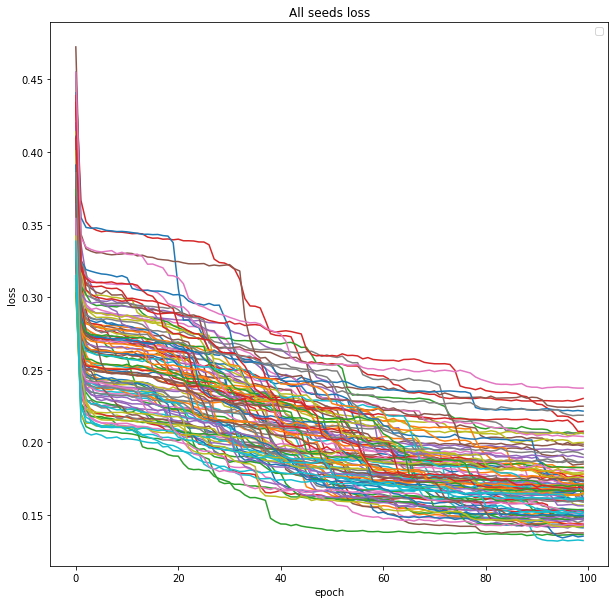

In [ ]:
print("training loss")
plot_seeds(train_loss_1)

Mean Training Loss


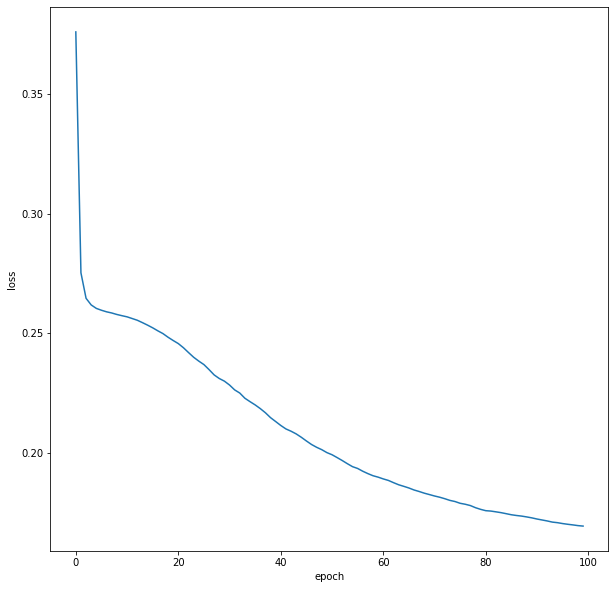

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_1_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


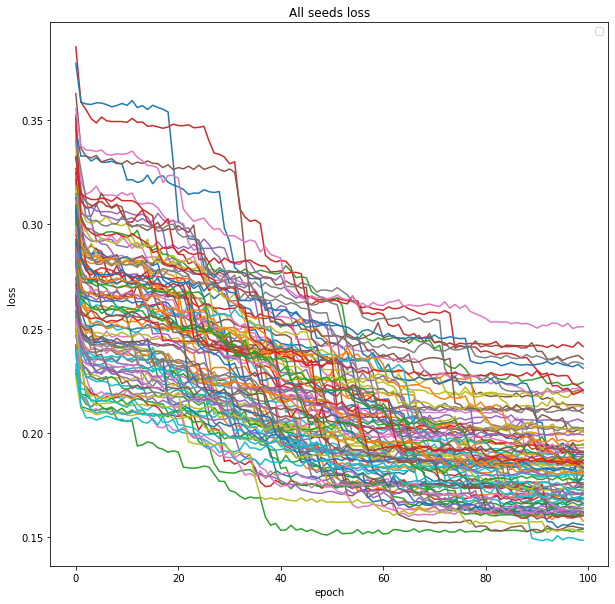

In [ ]:
print("testing loss")
plot_seeds(test_loss_1)

Mean Test Loss


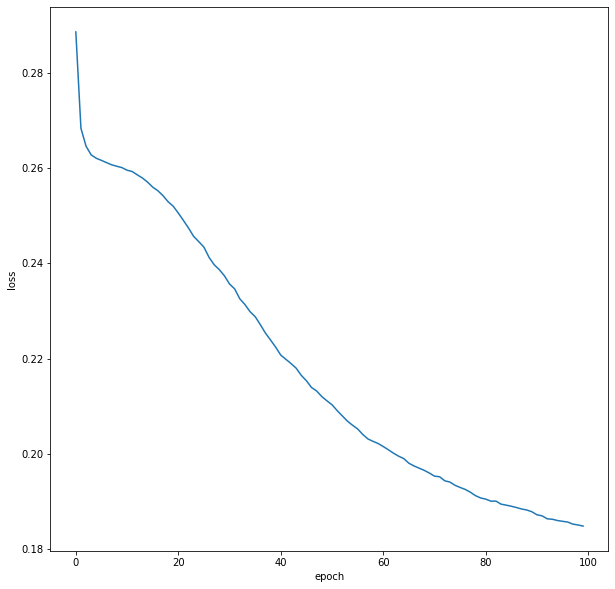

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_1_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 2

It is made of 4 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 50 neural with ReLU Activation
* Layer3 : 50 neural with ReLU Activation
* Layer4 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_2_training = simulation_processing(train_loss_2)
model_2_testing = simulation_processing(test_loss_2)

In [ ]:
model_2_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.381366,0.372433,0.329023,0.427413,0.341064,0.352376,0.372615,0.400117,0.448667,0.383908,...,0.372530,0.415540,0.410664,0.391005,0.355053,0.321179,0.280781,0.473148,0.389841,0.036855
1,0.263405,0.253804,0.229078,0.299141,0.254461,0.265705,0.293637,0.298323,0.339125,0.269810,...,0.305180,0.317859,0.287967,0.241495,0.287293,0.221451,0.194745,0.358784,0.287613,0.033532
2,0.233009,0.247002,0.212918,0.270121,0.244790,0.258768,0.290189,0.292348,0.326523,0.262066,...,0.298272,0.290275,0.281005,0.230849,0.283390,0.212723,0.190522,0.353673,0.278491,0.033984
3,0.225635,0.246015,0.210252,0.268159,0.243260,0.253711,0.287814,0.289262,0.325594,0.259736,...,0.297243,0.284225,0.278739,0.228849,0.280619,0.209559,0.188453,0.351814,0.276322,0.034179
4,0.224738,0.246775,0.209877,0.267167,0.241362,0.252371,0.288118,0.288628,0.323564,0.259683,...,0.295522,0.281976,0.278545,0.229189,0.280863,0.208740,0.187799,0.350206,0.275618,0.034227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.141500,0.173970,0.144901,0.192478,0.167717,0.202525,0.174452,0.201520,0.145059,0.179767,...,0.175933,0.165841,0.169321,0.177489,0.164395,0.146952,0.132625,0.211777,0.169611,0.020768
96,0.141528,0.173227,0.145476,0.192113,0.156159,0.203368,0.174797,0.201271,0.143998,0.180506,...,0.175403,0.165658,0.169129,0.177424,0.161527,0.145927,0.132253,0.210783,0.169042,0.020784
97,0.141150,0.173173,0.145705,0.191923,0.153675,0.203150,0.174465,0.199395,0.143210,0.180497,...,0.175504,0.166858,0.168914,0.179298,0.152516,0.146379,0.131105,0.210969,0.168438,0.020741
98,0.142425,0.172901,0.146044,0.191120,0.151897,0.202792,0.173866,0.196534,0.143553,0.179595,...,0.173879,0.166415,0.168923,0.179104,0.150324,0.145374,0.130748,0.210910,0.167889,0.020461


In [ ]:
model_2_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.272820,0.261829,0.242328,0.343188,0.267254,0.273908,0.303479,0.298169,0.366479,0.283819,...,0.311981,0.349027,0.296548,0.261682,0.296020,0.227783,0.200102,0.375404,0.299360,0.035023
1,0.241400,0.249418,0.219686,0.274428,0.248274,0.262054,0.298401,0.293196,0.333606,0.265312,...,0.299329,0.312306,0.282050,0.237797,0.286293,0.213906,0.193759,0.360848,0.282124,0.034362
2,0.226124,0.247352,0.210927,0.270794,0.248277,0.255778,0.292917,0.287920,0.331344,0.261621,...,0.298037,0.296708,0.280450,0.234902,0.281019,0.209062,0.188684,0.357872,0.278330,0.034450
3,0.231269,0.247466,0.211836,0.269344,0.246043,0.253058,0.295380,0.287562,0.326594,0.261250,...,0.294987,0.292761,0.278037,0.233548,0.280447,0.206614,0.187259,0.356207,0.277397,0.034608
4,0.222855,0.248488,0.211494,0.267973,0.245010,0.254236,0.294370,0.286614,0.324694,0.263426,...,0.295111,0.289599,0.279176,0.233100,0.281980,0.206875,0.188906,0.354649,0.277154,0.034632
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.156034,0.190495,0.161923,0.206922,0.171345,0.215107,0.195711,0.218133,0.168021,0.196084,...,0.191666,0.188922,0.186182,0.195118,0.178291,0.160412,0.151337,0.232787,0.186225,0.020037
96,0.156101,0.190413,0.161791,0.207602,0.170133,0.215779,0.196315,0.217677,0.166637,0.197405,...,0.190764,0.187528,0.187673,0.194290,0.165942,0.160127,0.152063,0.233275,0.185799,0.020014
97,0.158842,0.192901,0.160321,0.208160,0.167448,0.215033,0.194928,0.210897,0.166971,0.197497,...,0.189839,0.188210,0.187084,0.198340,0.165481,0.160602,0.151380,0.232782,0.185157,0.019685
98,0.156989,0.190099,0.161652,0.207978,0.167017,0.216034,0.195721,0.212907,0.165774,0.197638,...,0.189254,0.187366,0.186860,0.194831,0.164143,0.160425,0.150591,0.233600,0.185028,0.019904


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_2

[0.03763126320791429,
 0.07421344935583614,
 0.04017177579963271,
 0.13263530201291243,
 0.05105262570676155,
 0.10998226822655634,
 0.1430257587715558,
 0.10248601798988954,
 0.045425056101050784,
 0.1044671161787711,
 0.05336376849966845,
 0.06368946808909567,
 0.061254895952584716,
 0.04323040368343352,
 0.06944067760939779,
 0.044738838348776705,
 0.10742266302422078,
 0.042570881582160026,
 0.04106201274637056,
 0.046619440220289805,
 0.06330644313563404,
 0.06801651730855528,
 0.052218329307614095,
 0.05781202806013986,
 0.05286902912191106,
 0.061160218789158415,
 0.03963425609735489,
 0.1076786939713654,
 0.0500782577908533,
 0.12611685436212425,
 0.07467010514681167,
 0.03979676056413332,
 0.10158137069213628,
 0.1237944735442279,
 0.0485744150778285,
 0.07451430010840887,
 0.06486134489635315,
 0.10831110379191478,
 0.14349855332420375,
 0.037466448388467855,
 0.10201729017981846,
 0.06795148584378748,
 0.08277423925687045,
 0.08422792891945004,
 0.048488825207532116,
 0.0755

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


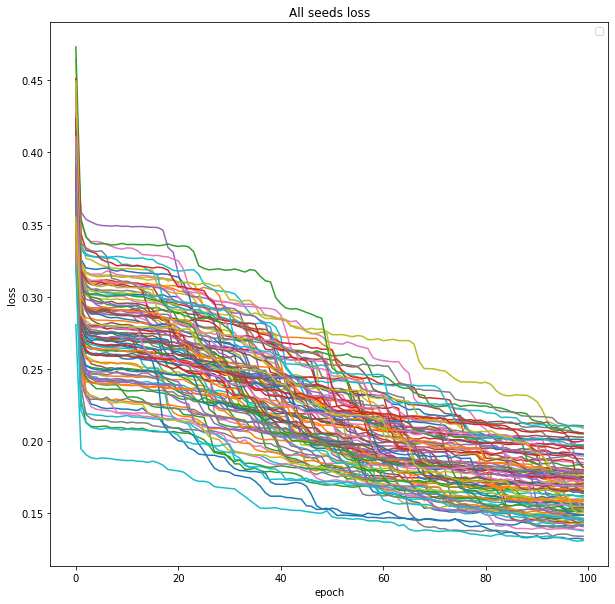

In [ ]:
print("training loss")
plot_seeds(train_loss_2)

Mean Training Loss


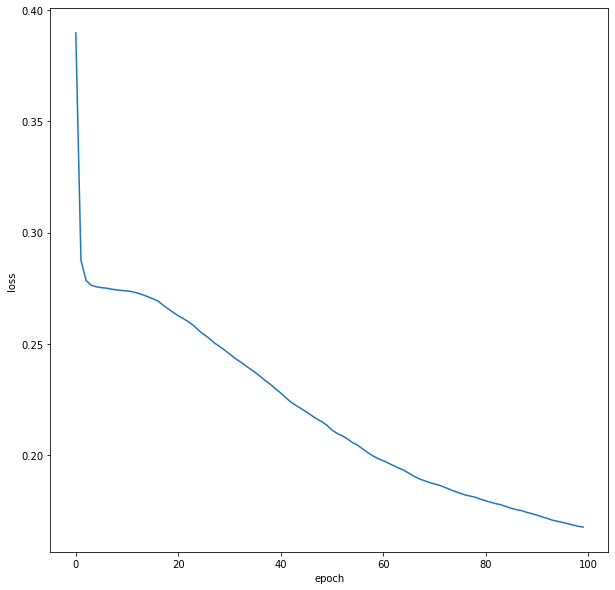

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_2_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


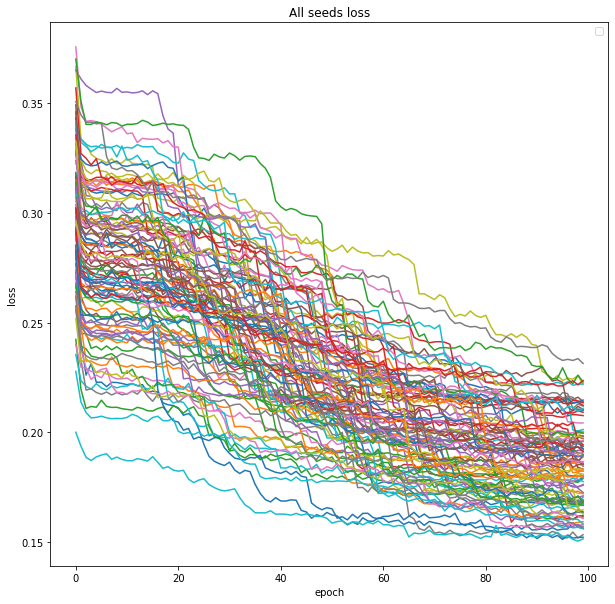

In [ ]:
print("testing loss")
plot_seeds(test_loss_2)

Mean Test Loss


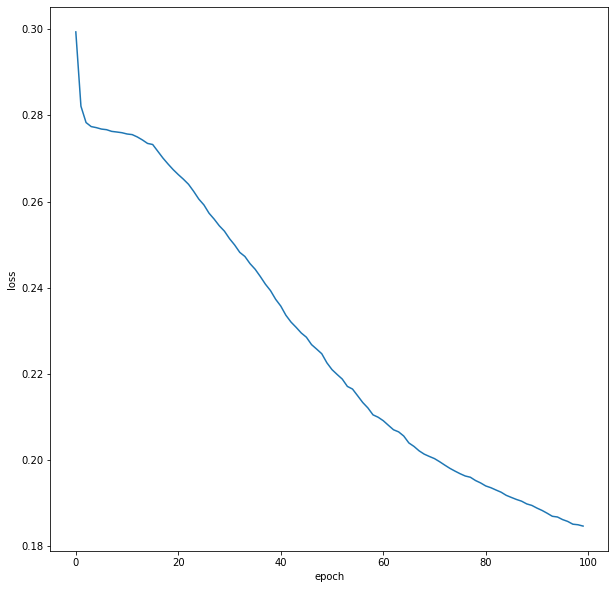

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_2_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 3

It is made of 5 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 50 neural with ReLU Activation
* Layer3 : 25 neural with ReLU Activation
* Layer4 : 50 neural with ReLU Activation
* Layer5 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_3_training = simulation_processing(train_loss_3)
model_3_testing = simulation_processing(test_loss_3)

In [ ]:
model_3_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.424348,0.393667,0.363706,0.440966,0.335623,0.505014,0.394871,0.440637,0.460432,0.426719,...,0.379121,0.382230,0.401507,0.428921,0.371854,0.380302,0.312139,0.528581,0.408927,0.047029
1,0.281597,0.298753,0.263196,0.360957,0.253532,0.357820,0.322526,0.333270,0.373992,0.332947,...,0.271829,0.303593,0.327556,0.295290,0.260379,0.311442,0.236551,0.416884,0.308535,0.042341
2,0.266877,0.290131,0.257214,0.356776,0.247512,0.340669,0.310964,0.320142,0.333868,0.326972,...,0.264779,0.297268,0.315627,0.281733,0.255544,0.298797,0.229923,0.411762,0.299057,0.041403
3,0.264308,0.289378,0.256754,0.356323,0.246537,0.338949,0.302077,0.317028,0.305652,0.326820,...,0.263235,0.294307,0.314204,0.278819,0.254138,0.294467,0.228976,0.410790,0.296634,0.041229
4,0.264418,0.289228,0.257108,0.356189,0.246662,0.338457,0.302142,0.317067,0.296627,0.327331,...,0.262583,0.293959,0.313671,0.277534,0.254594,0.294724,0.229163,0.410998,0.296133,0.041121
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.184276,0.158860,0.177083,0.173237,0.162980,0.260279,0.211978,0.191279,0.209645,0.201936,...,0.181225,0.147496,0.234466,0.169803,0.189438,0.174331,0.136286,0.275364,0.184492,0.029527
96,0.183254,0.158145,0.176699,0.173154,0.163083,0.261144,0.213043,0.190246,0.209733,0.201503,...,0.182098,0.146568,0.233869,0.169622,0.189398,0.174752,0.135580,0.272854,0.184061,0.029397
97,0.178926,0.158510,0.176027,0.172125,0.162665,0.260469,0.212391,0.191044,0.209469,0.201340,...,0.181578,0.148214,0.233998,0.168847,0.187219,0.173880,0.135231,0.264572,0.183073,0.028374
98,0.178117,0.159478,0.175753,0.172327,0.162596,0.259885,0.210213,0.190794,0.208974,0.201458,...,0.181725,0.147034,0.233678,0.168903,0.185912,0.174326,0.135119,0.263401,0.182234,0.028256


In [ ]:
model_3_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.304078,0.305159,0.277866,0.366690,0.259329,0.375403,0.331926,0.344181,0.385106,0.343702,...,0.271622,0.319976,0.332240,0.310986,0.263047,0.318796,0.244442,0.418383,0.319239,0.042854
1,0.264014,0.288025,0.260725,0.360010,0.245663,0.342463,0.321970,0.317572,0.357680,0.330642,...,0.256178,0.302797,0.312095,0.290136,0.252017,0.302792,0.233142,0.409092,0.302146,0.042253
2,0.261738,0.285733,0.260409,0.356619,0.245944,0.333542,0.305479,0.316296,0.315415,0.328012,...,0.254651,0.299465,0.311706,0.284131,0.251195,0.291423,0.232190,0.407568,0.298050,0.041434
3,0.260689,0.285498,0.257147,0.357050,0.247486,0.334992,0.304289,0.315599,0.297716,0.334877,...,0.255997,0.299671,0.310410,0.281699,0.249743,0.293731,0.230760,0.407596,0.297217,0.041502
4,0.263252,0.287913,0.259402,0.357583,0.244647,0.333811,0.305802,0.314416,0.296092,0.329036,...,0.253993,0.299565,0.310631,0.281167,0.255098,0.292977,0.231029,0.406796,0.297135,0.041071
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.195215,0.173535,0.192639,0.187151,0.175453,0.268982,0.229493,0.204872,0.225807,0.214537,...,0.193854,0.168751,0.241207,0.186127,0.196643,0.181629,0.147040,0.279713,0.198434,0.028499
96,0.189674,0.172847,0.191791,0.187475,0.174401,0.267852,0.231428,0.205260,0.226183,0.214692,...,0.192262,0.171899,0.240257,0.185310,0.196696,0.181291,0.147092,0.274562,0.197891,0.028138
97,0.187639,0.172823,0.191881,0.185890,0.174567,0.269160,0.227597,0.206230,0.225973,0.215520,...,0.192090,0.168417,0.241136,0.185646,0.193343,0.182689,0.147584,0.269160,0.196892,0.027361
98,0.188813,0.173455,0.191790,0.184877,0.174312,0.268059,0.225786,0.207906,0.216727,0.214234,...,0.192910,0.166728,0.242254,0.185264,0.193379,0.181888,0.148668,0.268059,0.196182,0.026817


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_3

[0.07095590756822764,
 0.0534383557868807,
 0.11803121121612464,
 0.10770747669961929,
 0.05595321347033408,
 0.21252627567376872,
 0.16322455813177497,
 0.08831418778751807,
 0.11361264273879196,
 0.09790372935452643,
 0.16169737043605345,
 0.08943625755696848,
 0.0673415376065575,
 0.10729682429232995,
 0.13831368153635742,
 0.12999498529387526,
 0.11338826438084355,
 0.06708180137741221,
 0.11556632645725866,
 0.09579980264362241,
 0.036356308372877906,
 0.06626479788547511,
 0.04943414154026251,
 0.07662812223800718,
 0.10067475111282395,
 0.05017141339239717,
 0.07025384440100732,
 0.052911715295177374,
 0.04240029138352089,
 0.0799849755653892,
 0.22479338744470184,
 0.07186962371075638,
 0.07430371925991146,
 0.07017915839020585,
 0.06924857223919985,
 0.04991087465241483,
 0.0634150957281385,
 0.04785945003992625,
 0.17986884579425003,
 0.0462134087098683,
 0.09644404186236978,
 0.04742030037232467,
 0.07414214734329085,
 0.11141619508097991,
 0.11220740612120096,
 0.0622796947

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


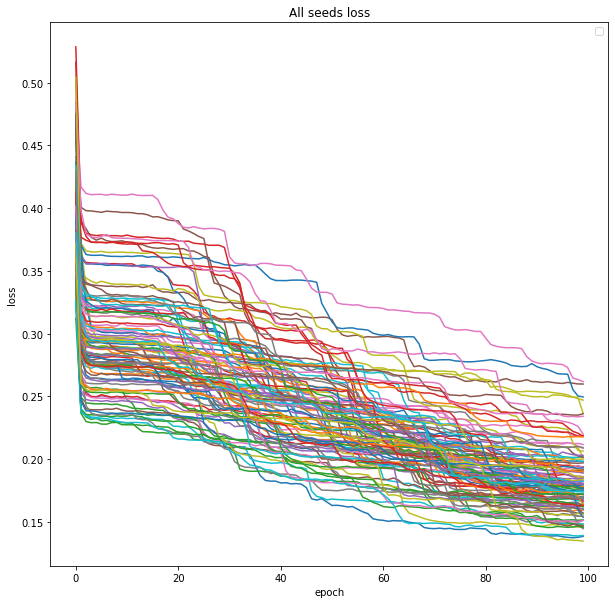

In [ ]:
print("training loss")
plot_seeds(train_loss_3)

Mean Training Loss


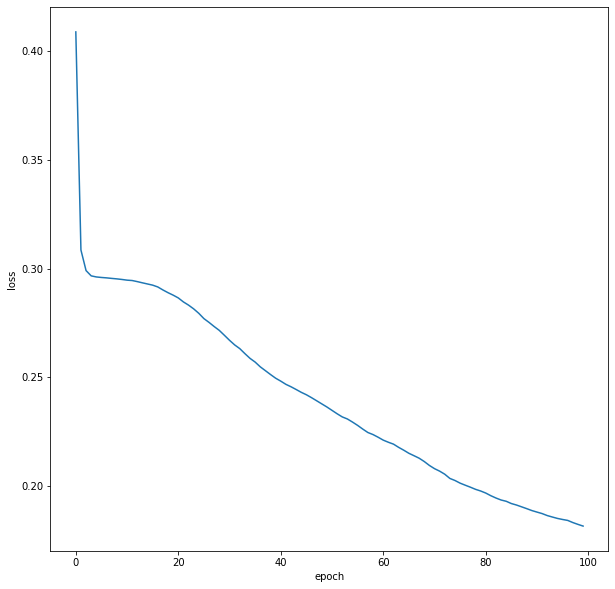

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_3_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


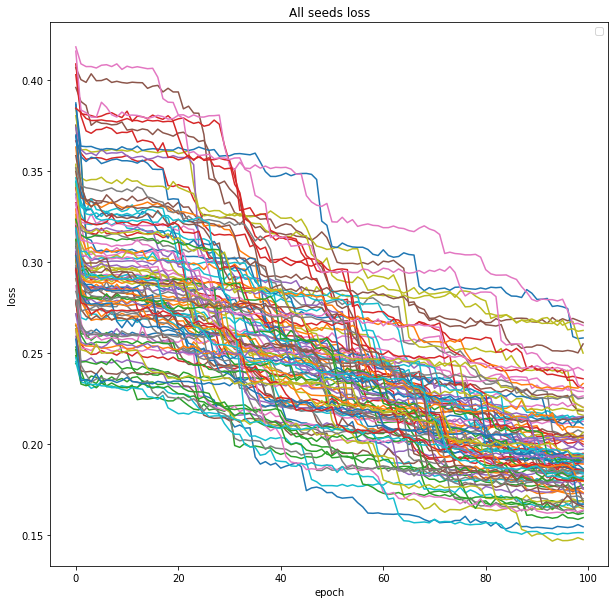

In [ ]:
print("testing loss")
plot_seeds(test_loss_3)

Mean Test Loss


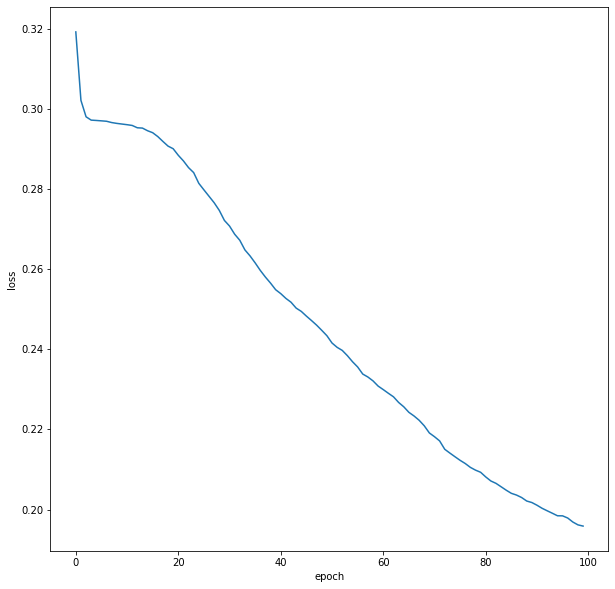

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_3_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 4

It is made of 6 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 50 neural with ReLU Activation
* Layer3 : 25 neural with ReLU Activation
* Layer4 : 25 neural with ReLU Activation
* Layer5 : 50 neural with ReLU Activation
* Layer6 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_4_training = simulation_processing(train_loss_4)
model_4_testing = simulation_processing(test_loss_4)

In [ ]:
model_4_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.404763,0.388639,0.426719,0.369035,0.336795,0.438398,0.373649,0.415909,0.464946,0.412502,...,0.411802,0.454934,0.445207,0.454636,0.359263,0.427548,0.287854,0.520278,0.410053,0.047196
1,0.296212,0.302945,0.324483,0.268481,0.276845,0.341732,0.281324,0.295423,0.335662,0.319816,...,0.341379,0.352862,0.331461,0.371407,0.260123,0.354215,0.210589,0.412912,0.310884,0.042253
2,0.289649,0.298232,0.316286,0.262718,0.272478,0.337880,0.278093,0.272409,0.328163,0.310959,...,0.335611,0.344921,0.325071,0.365539,0.255207,0.349730,0.205980,0.410153,0.302788,0.042258
3,0.286590,0.297660,0.315857,0.263633,0.271631,0.337054,0.276912,0.268087,0.327182,0.309321,...,0.334478,0.344292,0.323723,0.364742,0.253424,0.348368,0.205457,0.408143,0.301069,0.042361
4,0.285944,0.297235,0.316947,0.261145,0.271144,0.335937,0.275917,0.267408,0.326249,0.309281,...,0.334721,0.344466,0.323682,0.365919,0.252963,0.348067,0.205071,0.408545,0.300719,0.042443
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.182714,0.154421,0.202457,0.205344,0.149253,0.239026,0.207440,0.169802,0.232122,0.188164,...,0.243673,0.161612,0.219500,0.254085,0.167271,0.224045,0.137763,0.312418,0.197789,0.032107
96,0.176528,0.154032,0.202135,0.204902,0.149380,0.235452,0.206593,0.169467,0.232218,0.189078,...,0.240312,0.162843,0.219552,0.254700,0.168118,0.225190,0.137277,0.307069,0.196645,0.031726
97,0.175878,0.153370,0.201522,0.204823,0.148547,0.234972,0.196595,0.169354,0.232357,0.187262,...,0.237177,0.162059,0.217219,0.254368,0.168619,0.225243,0.137559,0.306156,0.195611,0.031623
98,0.175825,0.154068,0.201287,0.204601,0.147933,0.234600,0.194549,0.169577,0.232419,0.183568,...,0.236421,0.161614,0.217015,0.254244,0.168241,0.225040,0.137588,0.305735,0.195002,0.031579


In [ ]:
model_4_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.308913,0.315207,0.343222,0.278045,0.277909,0.344732,0.288244,0.305309,0.353432,0.336427,...,0.348471,0.363664,0.340736,0.379505,0.264148,0.361575,0.211894,0.419913,0.321920,0.043541
1,0.291278,0.299870,0.324201,0.268707,0.270511,0.334088,0.280031,0.276383,0.332983,0.315529,...,0.332734,0.348840,0.328505,0.372042,0.254416,0.348572,0.207568,0.417803,0.305738,0.042308
2,0.289920,0.298986,0.317487,0.268612,0.267967,0.332401,0.282395,0.264325,0.335084,0.313971,...,0.330675,0.349730,0.325474,0.367775,0.253180,0.346395,0.205727,0.415325,0.302586,0.042609
3,0.287853,0.298202,0.321594,0.267834,0.266894,0.332257,0.280209,0.264952,0.334466,0.312121,...,0.331392,0.349438,0.325619,0.369333,0.254260,0.346184,0.205712,0.414814,0.302300,0.042686
4,0.287240,0.297749,0.319352,0.265245,0.266813,0.332698,0.276925,0.264539,0.332218,0.311837,...,0.331956,0.348546,0.325327,0.372964,0.252085,0.346366,0.205412,0.416291,0.301823,0.042814
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.187359,0.167177,0.209969,0.219227,0.158826,0.247062,0.221267,0.180601,0.250501,0.200515,...,0.250071,0.177541,0.232478,0.269486,0.180883,0.231697,0.150683,0.320728,0.209106,0.031260
96,0.186657,0.166365,0.211526,0.219861,0.156989,0.245241,0.212056,0.182257,0.249329,0.200019,...,0.244110,0.177716,0.231307,0.270563,0.180602,0.232354,0.150764,0.321012,0.208192,0.031440
97,0.184872,0.166092,0.212383,0.219080,0.157168,0.245290,0.207976,0.181085,0.249608,0.195630,...,0.244282,0.176836,0.229124,0.270416,0.179419,0.232625,0.150502,0.320656,0.207535,0.031251
98,0.185615,0.166868,0.210415,0.218908,0.157377,0.245418,0.207580,0.181035,0.249335,0.193099,...,0.245113,0.177483,0.228809,0.270045,0.180990,0.232941,0.150554,0.318295,0.207005,0.031100


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_4

[0.06172970604054173,
 0.053384100851213694,
 0.11805984628319993,
 0.1585052525876729,
 0.040032698491509394,
 0.18141340540407103,
 0.10935813824914423,
 0.05826018483784615,
 0.17137804598621142,
 0.06596714476789249,
 0.11199744569880599,
 0.09758748412590716,
 0.04762973157052203,
 0.051412294405504086,
 0.08649789425225654,
 0.10687135112404716,
 0.08712183950022455,
 0.03987557367892607,
 0.14173011125940713,
 0.1568425635981635,
 0.06957015626617809,
 0.11731143015590106,
 0.06646170372892501,
 0.10991854779083524,
 0.08312846350163429,
 0.10295850930032566,
 0.10847640502582725,
 0.051162450779130134,
 0.10863140045242148,
 0.0736829763388359,
 0.2861180230222445,
 0.07535495244481641,
 0.09677523389516797,
 0.09434048628037871,
 0.09375489126626288,
 0.10823120507657513,
 0.17287304455947705,
 0.12872205033348932,
 0.17075537131611618,
 0.03477572880341457,
 0.1140256262996363,
 0.11677545742696653,
 0.05905833401419427,
 0.1090092288507753,
 0.04114452108520696,
 0.143891786

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


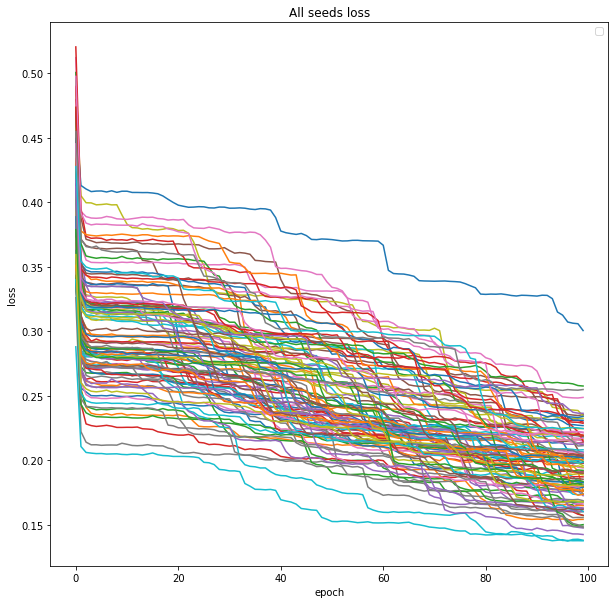

In [ ]:
print("training loss")
plot_seeds(train_loss_4)

Mean Training Loss


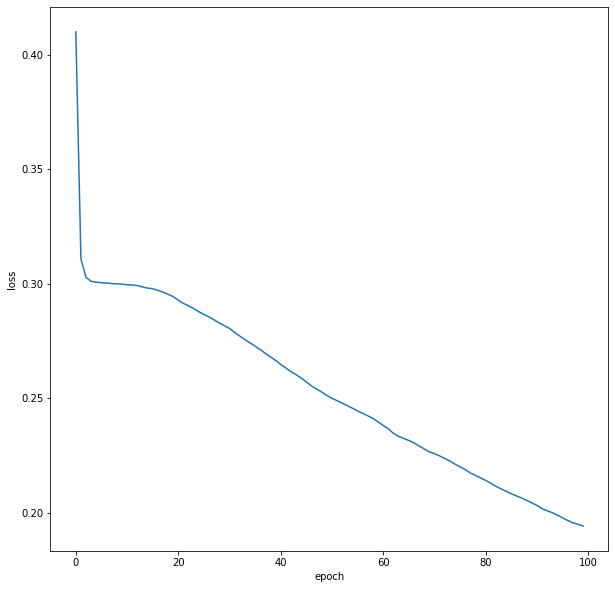

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_4_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


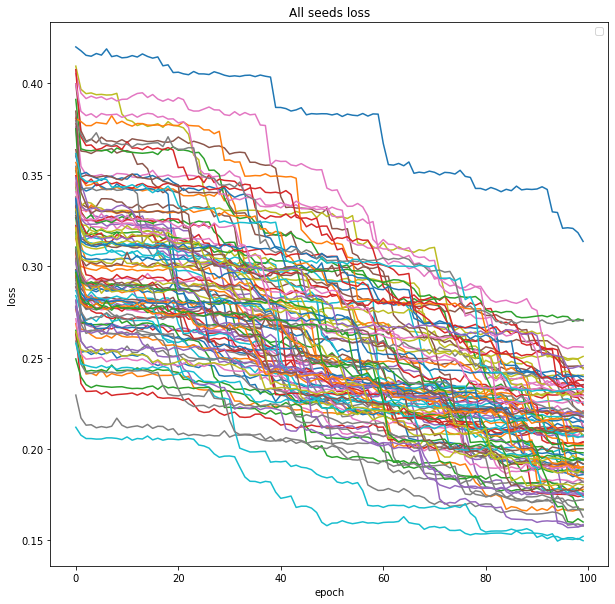

In [ ]:
print("testing loss")
plot_seeds(test_loss_4)

Mean Test Loss


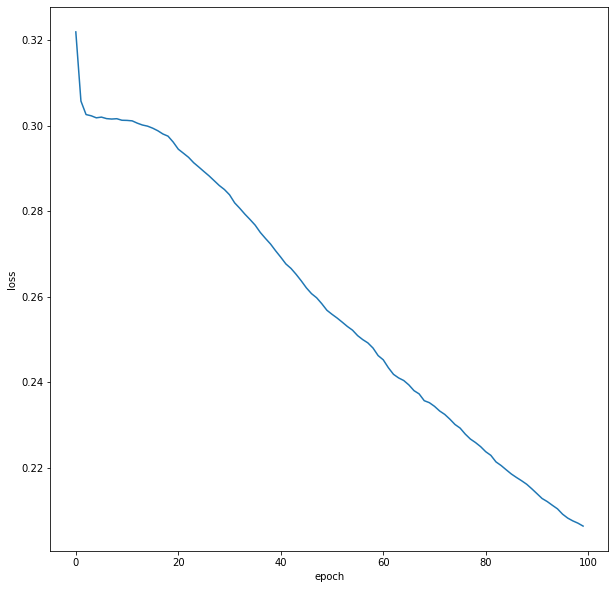

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_4_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 5

It is made of 7 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 75 neural with ReLU Activation
* Layer3 : 50 neural with ReLU Activation
* Layer4 : 25 neural with ReLU Activation
* Layer5 : 50 neural with ReLU Activation
* Layer6 : 75 neural with ReLU Activation
* Layer7 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_5_training = simulation_processing(train_loss_5)
model_5_testing = simulation_processing(test_loss_5)

In [ ]:
model_5_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.413514,0.356223,0.395583,0.396059,0.368237,0.503853,0.390424,0.446689,0.387100,0.471160,...,0.404379,0.406270,0.433009,0.465509,0.374332,0.362725,0.306396,0.547533,0.420146,0.050107
1,0.300642,0.249082,0.254284,0.311954,0.280124,0.364835,0.279390,0.335534,0.267266,0.329444,...,0.288200,0.319658,0.334441,0.328676,0.257555,0.265910,0.223916,0.405137,0.302337,0.039033
2,0.295040,0.238003,0.244245,0.303929,0.273322,0.343867,0.273458,0.329325,0.254369,0.320403,...,0.277684,0.312696,0.315221,0.315719,0.250460,0.263248,0.218113,0.381695,0.292770,0.037490
3,0.292994,0.236561,0.242573,0.303037,0.264088,0.325847,0.272136,0.327897,0.252125,0.319667,...,0.275776,0.311224,0.312739,0.312880,0.249366,0.262774,0.216450,0.377833,0.290605,0.037345
4,0.292155,0.236109,0.242185,0.302814,0.260041,0.320111,0.272014,0.327340,0.251893,0.319516,...,0.275901,0.309720,0.312104,0.312052,0.249212,0.260734,0.216402,0.377206,0.290040,0.037380
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.158775,0.179267,0.168849,0.211267,0.145375,0.238502,0.168433,0.236516,0.173608,0.178806,...,0.173108,0.176473,0.153240,0.263542,0.179726,0.141596,0.134207,0.263542,0.183622,0.027988
96,0.161905,0.178398,0.169621,0.210315,0.145258,0.238712,0.169644,0.236381,0.173354,0.178174,...,0.173598,0.173848,0.153086,0.263870,0.179278,0.141932,0.134510,0.263870,0.182584,0.027712
97,0.160904,0.178535,0.168359,0.208009,0.145435,0.239876,0.169234,0.234076,0.172766,0.175272,...,0.174568,0.174044,0.152130,0.259568,0.179628,0.141943,0.134616,0.259568,0.181103,0.027207
98,0.158983,0.169668,0.167821,0.207538,0.144322,0.239001,0.168872,0.233332,0.171630,0.175668,...,0.174406,0.175855,0.149828,0.251151,0.179576,0.141778,0.133659,0.252377,0.180161,0.026500


In [ ]:
model_5_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.303725,0.269240,0.271074,0.317428,0.283775,0.373005,0.292936,0.340055,0.281805,0.344116,...,0.291378,0.330150,0.346722,0.351902,0.263030,0.268029,0.222699,0.424084,0.314028,0.041242
1,0.301125,0.241068,0.251372,0.309473,0.275185,0.352433,0.279720,0.327572,0.260312,0.322658,...,0.269834,0.313035,0.322344,0.318764,0.249502,0.262038,0.216653,0.385082,0.295762,0.037990
2,0.292050,0.236951,0.246471,0.306222,0.269412,0.336660,0.276098,0.323801,0.256263,0.321444,...,0.268560,0.313675,0.316741,0.315392,0.247067,0.265800,0.215179,0.381460,0.292225,0.037545
3,0.290968,0.237204,0.246146,0.306273,0.260504,0.321901,0.272392,0.324411,0.257298,0.321799,...,0.268329,0.309762,0.314661,0.315357,0.245612,0.259981,0.214879,0.381021,0.291126,0.037440
4,0.289469,0.236390,0.246382,0.306258,0.259585,0.316827,0.273565,0.325622,0.254359,0.319785,...,0.266630,0.309881,0.313767,0.313776,0.245874,0.259355,0.214118,0.380097,0.290817,0.037360
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.173959,0.191575,0.181130,0.218818,0.159456,0.252058,0.184719,0.243706,0.189367,0.194340,...,0.181837,0.186691,0.168009,0.272736,0.186494,0.156723,0.145912,0.272736,0.195555,0.027025
96,0.172309,0.190516,0.179384,0.216727,0.158794,0.251191,0.183054,0.240457,0.190196,0.193198,...,0.190681,0.185181,0.167299,0.267206,0.187674,0.157988,0.146793,0.267206,0.194006,0.026137
97,0.171586,0.186520,0.178443,0.216539,0.158403,0.254090,0.184088,0.240835,0.188865,0.191612,...,0.184616,0.187326,0.167278,0.267132,0.187068,0.159498,0.147007,0.267132,0.193323,0.026178
98,0.172225,0.180902,0.176899,0.216932,0.156545,0.251212,0.184272,0.237263,0.190160,0.192968,...,0.183952,0.187369,0.166252,0.253620,0.187627,0.157173,0.147415,0.263706,0.192429,0.025268


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_5

[0.051263807576517904,
 0.05900530093619708,
 0.0527087658816988,
 0.0995335881722706,
 0.03915537263853406,
 0.17944319231638367,
 0.06295406271752109,
 0.18030907902561183,
 0.07645336295430645,
 0.0819717340755521,
 0.11310077520665324,
 0.06146749589376845,
 0.08396714281502943,
 0.04917747329554763,
 0.13433092717047507,
 0.16433313893396143,
 0.05728519696452186,
 0.11022622582674865,
 0.09039079204760807,
 0.10886472982858858,
 0.08949596857800855,
 0.16778810932605615,
 0.10979386953960427,
 0.04607212197875103,
 0.10291050812247202,
 0.07620483125457259,
 0.0744233650933905,
 0.04194594510853995,
 0.10089058005419098,
 0.10936641854229304,
 0.1239249728314258,
 0.0556288817027938,
 0.10060980689827483,
 0.07760537397918965,
 0.04745617240694302,
 0.19233630155818726,
 0.08248439503515936,
 0.10317029580962264,
 0.11916695034080849,
 0.040301164755018465,
 0.056069443644476316,
 0.07788623923962323,
 0.07608720745798238,
 0.09101643233134821,
 0.10788520621863733,
 0.0919004169

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


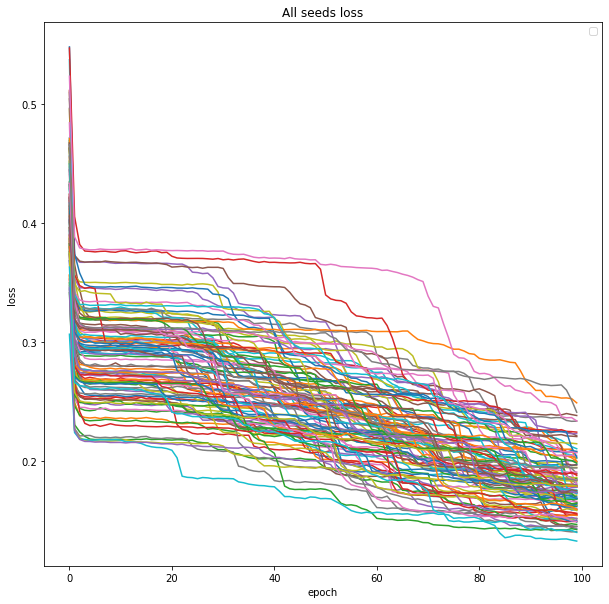

In [ ]:
print("training loss")
plot_seeds(train_loss_5)

Mean Training Loss


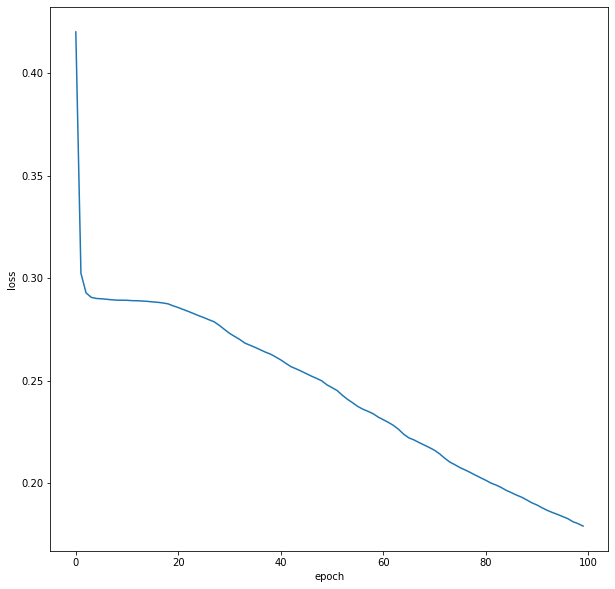

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_5_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


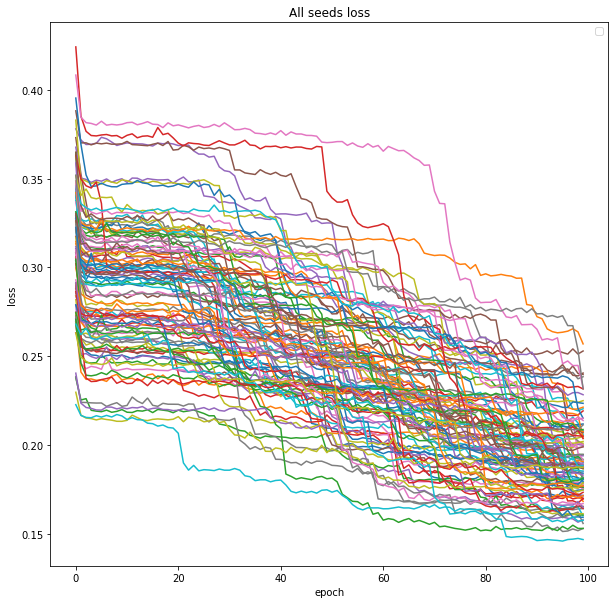

In [ ]:
print("testing loss")
plot_seeds(test_loss_5)

Mean Test Loss


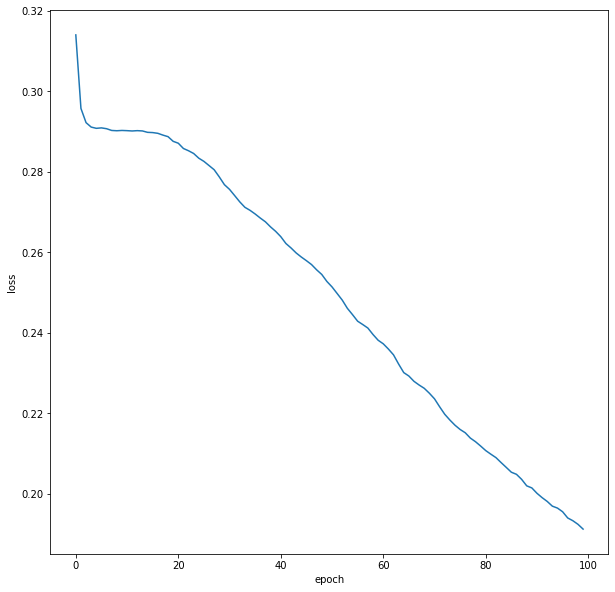

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_5_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 6

It is made of 8 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 75 neural with ReLU Activation
* Layer3 : 50 neural with ReLU Activation
* Layer4 : 25 neural with ReLU Activation
* Layer5 : 25 neural with ReLU Activation
* Layer6 : 50 neural with ReLU Activation
* Layer7 : 75 neural with ReLU Activation
* Layer8 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_6_training = simulation_processing(train_loss_6)
model_6_testing = simulation_processing(test_loss_6)

In [ ]:
model_6_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.452265,0.446123,0.418022,0.416837,0.352223,0.395939,0.411475,0.400034,0.401240,0.444617,...,0.438865,0.434296,0.444690,0.390650,0.350411,0.359392,0.326280,0.525941,0.423109,0.043882
1,0.327620,0.312228,0.274491,0.321606,0.260887,0.257258,0.295506,0.247553,0.293177,0.340350,...,0.341520,0.329253,0.338354,0.273878,0.239246,0.283382,0.232989,0.407309,0.311781,0.040002
2,0.319026,0.301668,0.265231,0.312421,0.243680,0.251309,0.288361,0.234367,0.283833,0.335776,...,0.335670,0.321234,0.331286,0.270148,0.228734,0.279250,0.226362,0.401013,0.302395,0.040430
3,0.317451,0.295752,0.263777,0.310989,0.238501,0.250841,0.287660,0.232393,0.268587,0.336139,...,0.335648,0.318782,0.330871,0.269558,0.227741,0.279363,0.225227,0.400633,0.300576,0.040743
4,0.317845,0.286834,0.262494,0.311327,0.238826,0.249688,0.287946,0.232101,0.267265,0.335714,...,0.335083,0.309808,0.330669,0.268473,0.228061,0.280124,0.224873,0.400611,0.299905,0.040731
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.186603,0.173491,0.233342,0.221439,0.182084,0.196411,0.186996,0.189248,0.175306,0.193908,...,0.269753,0.158068,0.162181,0.186468,0.174860,0.218860,0.146530,0.271788,0.196386,0.029369
96,0.176067,0.172267,0.233032,0.221822,0.182266,0.192363,0.186600,0.188324,0.174957,0.193226,...,0.264057,0.158383,0.158365,0.185957,0.174180,0.214017,0.146139,0.272233,0.194748,0.029136
97,0.171657,0.172606,0.232905,0.221657,0.182105,0.191895,0.186047,0.189660,0.171359,0.192737,...,0.262370,0.156859,0.157842,0.186292,0.172925,0.205411,0.145865,0.271648,0.193298,0.028911
98,0.172446,0.172385,0.232763,0.221291,0.180412,0.191451,0.183729,0.189130,0.171355,0.192289,...,0.262386,0.157014,0.156841,0.186844,0.171049,0.204708,0.144697,0.271903,0.191968,0.028718


In [ ]:
model_6_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.336242,0.324000,0.288272,0.330280,0.274717,0.260493,0.307628,0.260801,0.302374,0.346534,...,0.357073,0.345247,0.353795,0.284529,0.248472,0.288660,0.242265,0.418943,0.324263,0.041429
1,0.320503,0.301069,0.268002,0.314750,0.251841,0.253690,0.294983,0.231573,0.293599,0.337363,...,0.333368,0.319939,0.329254,0.273801,0.227126,0.277141,0.227126,0.401294,0.304889,0.040332
2,0.316530,0.298691,0.266187,0.312283,0.238954,0.248632,0.288797,0.227301,0.269962,0.337906,...,0.334584,0.318655,0.328942,0.272508,0.225616,0.279088,0.225616,0.400643,0.301860,0.040747
3,0.317829,0.285782,0.262271,0.311958,0.238739,0.247789,0.290461,0.229666,0.270186,0.342641,...,0.333485,0.308383,0.328581,0.273875,0.227237,0.277658,0.227237,0.402025,0.301053,0.040884
4,0.317975,0.284840,0.266224,0.312015,0.239039,0.249882,0.290311,0.228896,0.269954,0.336304,...,0.333437,0.305288,0.328463,0.271128,0.223888,0.278516,0.223888,0.400394,0.300890,0.040901
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.197571,0.182025,0.241171,0.229674,0.189985,0.202712,0.197610,0.197558,0.186250,0.205360,...,0.268644,0.174896,0.169205,0.203339,0.180407,0.221965,0.158631,0.281378,0.205968,0.028437
96,0.183658,0.183626,0.242853,0.230278,0.189475,0.200789,0.194876,0.198675,0.181841,0.205106,...,0.265516,0.172569,0.168133,0.205833,0.181166,0.207619,0.158197,0.281579,0.203892,0.027957
97,0.183253,0.182107,0.241832,0.230479,0.191291,0.200722,0.196908,0.198314,0.185750,0.204626,...,0.266071,0.171711,0.167313,0.202195,0.177986,0.209678,0.156793,0.281373,0.202901,0.027883
98,0.181345,0.182016,0.243186,0.228531,0.186660,0.201279,0.187704,0.195067,0.184591,0.207354,...,0.265824,0.170955,0.168525,0.203931,0.175984,0.207855,0.153494,0.281528,0.201587,0.027818


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_6

[0.05765132825367023,
 0.061237189756558646,
 0.18764918233361555,
 0.14630036841303912,
 0.0681061341174059,
 0.06668942070850209,
 0.08772622950561501,
 0.07219692254446149,
 0.057439988076245195,
 0.0878218077665352,
 0.09612128154723026,
 0.04153759626139575,
 0.06792081221430903,
 0.15376257876576335,
 0.13140103146550786,
 0.133172278317668,
 0.04652971109885534,
 0.0506984643778977,
 0.1892313637690148,
 0.15034532934484454,
 0.10057537978241679,
 0.13397551552394046,
 0.0777886214444635,
 0.1076290434084696,
 0.1373052501479849,
 0.12993843402160085,
 0.11766545380198119,
 0.09579332911272338,
 0.041314684538481715,
 0.15769946324768733,
 0.11817223253752303,
 0.05057200461573174,
 0.09029955249155278,
 0.05873788365736368,
 0.037964418657744615,
 0.07067780737119247,
 0.22702426347726373,
 0.2817159706146753,
 0.125149523572455,
 0.1034444169410006,
 0.08452440728043153,
 0.16772971515190604,
 0.05189221405434882,
 0.17659908180935324,
 0.12916348902122016,
 0.1359509567578831

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


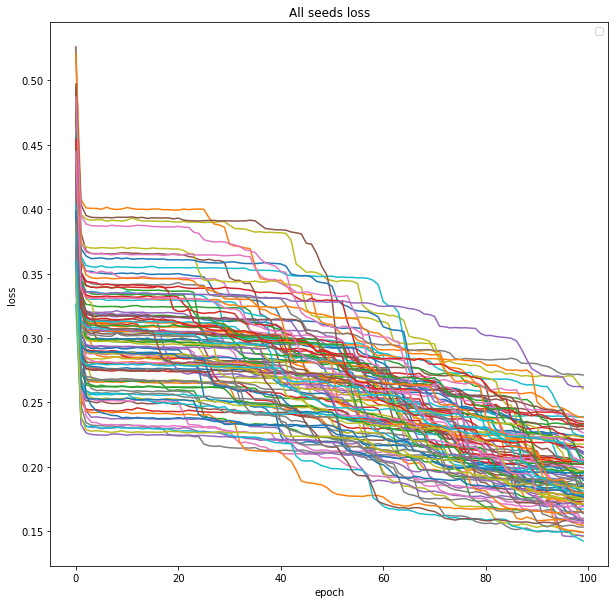

In [ ]:
print("training loss")
plot_seeds(train_loss_6)

Mean Training Loss


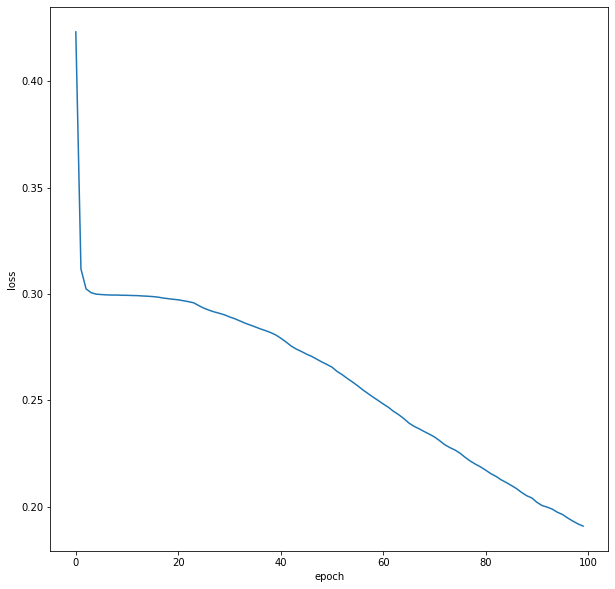

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_6_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


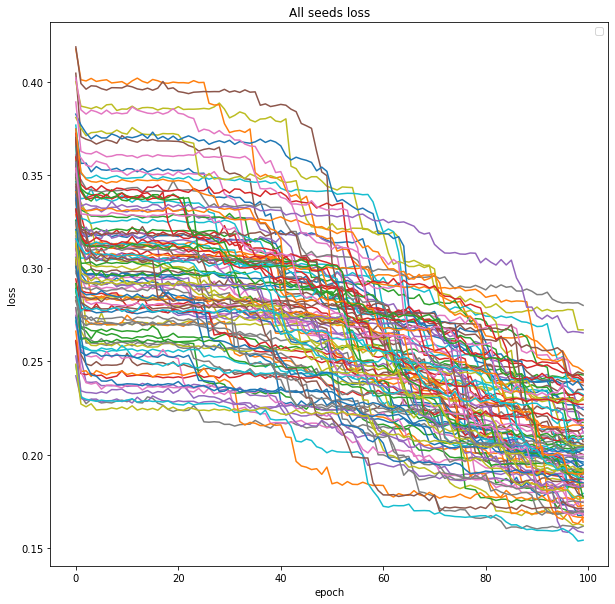

In [ ]:
print("testing loss")
plot_seeds(test_loss_6)

Mean Test Loss


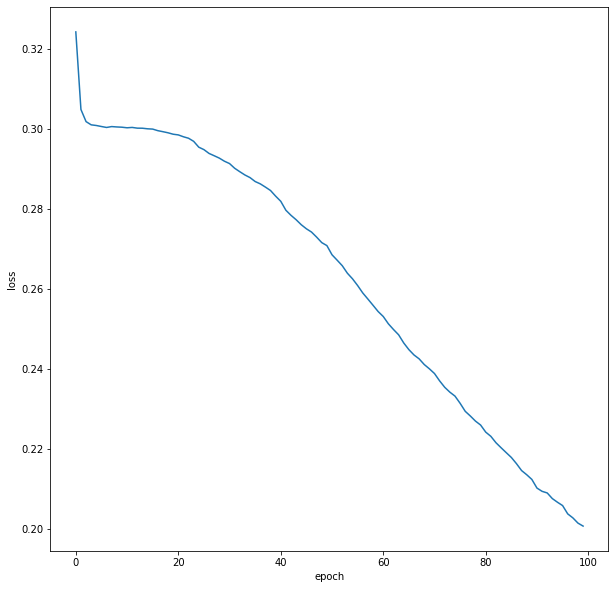

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_6_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Comparative Graph of all model



*   Training loss
*   Testing loss



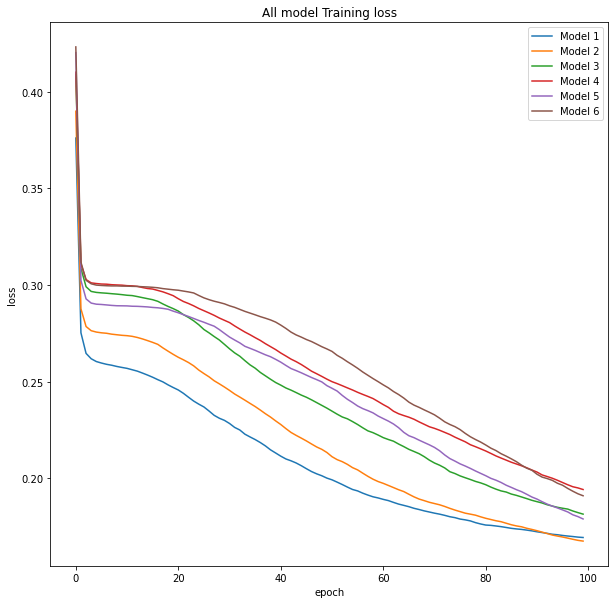

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(model_1_training.loc[:,'mean'], label = "Model 1")
plt.plot(model_2_training.loc[:,'mean'], label = "Model 2")
plt.plot(model_3_training.loc[:,'mean'], label = "Model 3")
plt.plot(model_4_training.loc[:,'mean'], label = "Model 4")
plt.plot(model_5_training.loc[:,'mean'], label = "Model 5")
plt.plot(model_6_training.loc[:,'mean'], label = "Model 6")
plt.title('All model Training loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend()
plt.show()

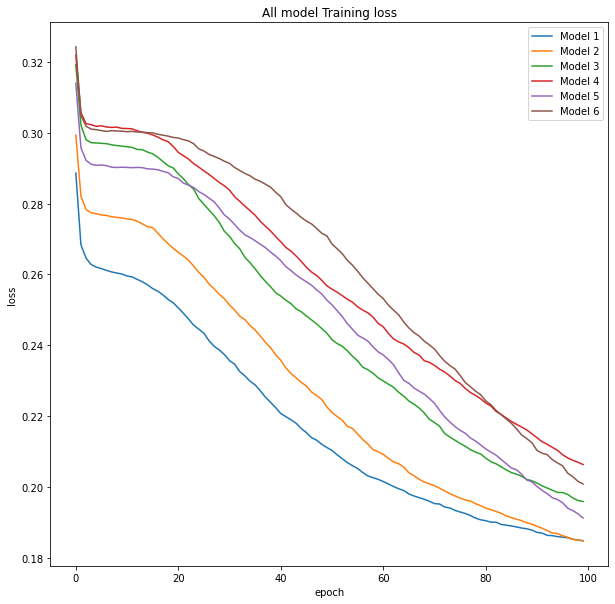

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(model_1_testing.loc[:,'mean'], label = "Model 1")
plt.plot(model_2_testing.loc[:,'mean'], label = "Model 2")
plt.plot(model_3_testing.loc[:,'mean'], label = "Model 3")
plt.plot(model_4_testing.loc[:,'mean'], label = "Model 4")
plt.plot(model_5_testing.loc[:,'mean'], label = "Model 5")
plt.plot(model_6_testing.loc[:,'mean'], label = "Model 6")
plt.title('All model Training loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend()
plt.show()